# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

A subdirectory or file data already exists.


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

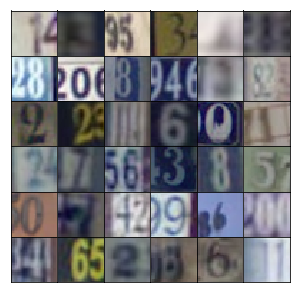

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), self.scaler(y)

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [26]:
def convolutional_layer_transpose(input_layer, filter_size, kernal_size, strides, trainingFLAG, alpha):
    
    internal_convolutional_layer = tf.layers.conv2d_transpose(input_layer, filter_size, kernal_size, 
                                                    strides, 'same')
    
    batch_normalized_layer = tf.layers.batch_normalization(internal_convolutional_layer,
                                                     training = trainingFLAG)
    
    activated_layer = tf.maximum(alpha * batch_normalized_layer,  batch_normalized_layer)
    
    return activated_layer
    

In [27]:
def generator(z, output_dim, reuse=False, alpha=0.2, trainingFLAG=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        # why not ?
        #  x = tf.layers.dense(z, 4 * 4 * 512, use_bias = False, activation = None)
        x = tf.layers.dense(z, 4 * 4 * 512)
        x = tf.reshape(x, (-1, 4, 4, 512))
        x = tf.layers.batch_normalization(x, training = trainingFLAG)
        x = tf.maximum( alpha * x,  x)
                
        convolutional_layer_1 = convolutional_layer_transpose(x, 256, 5, 2, trainingFLAG, alpha)
        
        convolutional_layer_2 = convolutional_layer_transpose(convolutional_layer_1, 128, 5, 2, 
                                                    trainingFLAG, alpha)
        
        # why not this layer too???
        #convolutional_layer_3 = convolutional_layer(convolutional_layer_2, 64, 5, 2, trainingFLAG, alpha)
           
        # Output layer, 32x32x3
        # Transpose convolutional layer
        logits = tf.layers.conv2d_transpose(convolutional_layer_2, output_dim, 5, strides = 2,
                                            padding = 'same')
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [28]:
def convolutional_layer(input_layer, filter_size, kernal_size, strides, trainingFLAG, alpha):
    
    internal_convolutional_layer = tf.layers.conv2d(input_layer, filter_size, kernal_size, 
                                                    strides, 'same')
    
    batch_normalized_layer = tf.layers.batch_normalization(internal_convolutional_layer,
                                                     training = trainingFLAG)
    
    activated_layer = tf.maximum(alpha * batch_normalized_layer,  batch_normalized_layer)
    
    return activated_layer

In [29]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        
        convolutional_layer_no_normalize = tf.layers.conv2d(x, 64, 5, 2, 'same')
    
        convolutional_layer_no_normalize = tf.maximum(alpha * convolutional_layer_no_normalize,
                                                      convolutional_layer_no_normalize)
        
        convolutional_layer_2 = convolutional_layer(convolutional_layer_no_normalize, 
                                                    128, 5, 2, True, alpha)
        
        convolutional_layer_3 = convolutional_layer(convolutional_layer_2,
                                                    256, 5, 2, True, alpha)
        
        flattened = tf.reshape(convolutional_layer_3, (-1, 4 * 4 * 256))
        logits = tf.layers.dense(flattened, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [30]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Again, nothing new here.

In [31]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [32]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=0.2)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, 0.5)

Here is a function for displaying generated images.

In [33]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img)
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network.

In [34]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(50, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 5, 10, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very senstive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [37]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.001
batch_size = 128
epochs = 25
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/25... Discriminator Loss: 0.2966... Generator Loss: 18.7594
Epoch 1/25... Discriminator Loss: 0.0142... Generator Loss: 9.5974
Epoch 1/25... Discriminator Loss: 0.0241... Generator Loss: 8.2154
Epoch 1/25... Discriminator Loss: 1.0637... Generator Loss: 5.4190
Epoch 1/25... Discriminator Loss: 2.7469... Generator Loss: 4.4721
Epoch 1/25... Discriminator Loss: 0.7600... Generator Loss: 1.6479
Epoch 1/25... Discriminator Loss: 0.4349... Generator Loss: 2.0013
Epoch 1/25... Discriminator Loss: 0.7777... Generator Loss: 1.7648
Epoch 1/25... Discriminator Loss: 1.0866... Generator Loss: 1.3006
Epoch 1/25... Discriminator Loss: 0.6290... Generator Loss: 1.6799


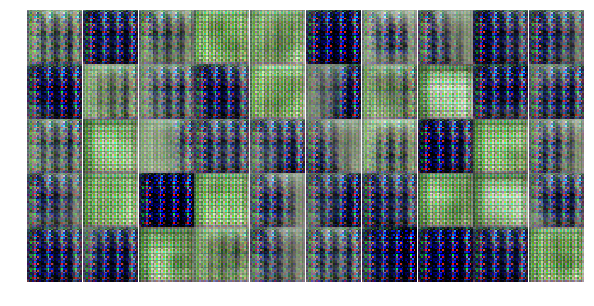

Epoch 1/25... Discriminator Loss: 2.5372... Generator Loss: 0.1373
Epoch 1/25... Discriminator Loss: 0.7335... Generator Loss: 1.0011
Epoch 1/25... Discriminator Loss: 2.0412... Generator Loss: 0.2244
Epoch 1/25... Discriminator Loss: 0.7917... Generator Loss: 1.0505
Epoch 1/25... Discriminator Loss: 1.2294... Generator Loss: 0.7376
Epoch 1/25... Discriminator Loss: 0.8690... Generator Loss: 1.0151
Epoch 1/25... Discriminator Loss: 0.9321... Generator Loss: 2.0373
Epoch 1/25... Discriminator Loss: 0.6034... Generator Loss: 2.5730
Epoch 1/25... Discriminator Loss: 0.7586... Generator Loss: 0.8407
Epoch 1/25... Discriminator Loss: 0.2061... Generator Loss: 2.9239


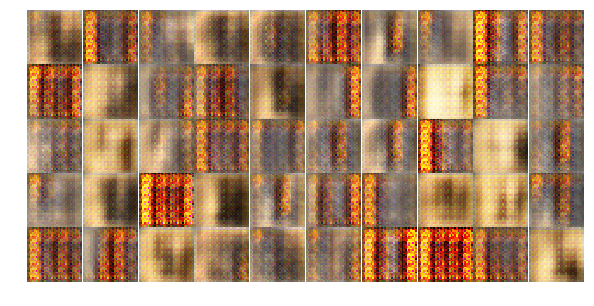

Epoch 1/25... Discriminator Loss: 1.2513... Generator Loss: 0.8810
Epoch 1/25... Discriminator Loss: 0.8168... Generator Loss: 1.2134
Epoch 1/25... Discriminator Loss: 0.5071... Generator Loss: 1.4224
Epoch 1/25... Discriminator Loss: 1.2220... Generator Loss: 0.5989
Epoch 1/25... Discriminator Loss: 0.6182... Generator Loss: 2.1310
Epoch 1/25... Discriminator Loss: 3.9123... Generator Loss: 4.9038
Epoch 1/25... Discriminator Loss: 0.9845... Generator Loss: 0.6751
Epoch 1/25... Discriminator Loss: 0.7885... Generator Loss: 1.2822
Epoch 1/25... Discriminator Loss: 1.4614... Generator Loss: 0.4986
Epoch 1/25... Discriminator Loss: 0.9710... Generator Loss: 0.7524


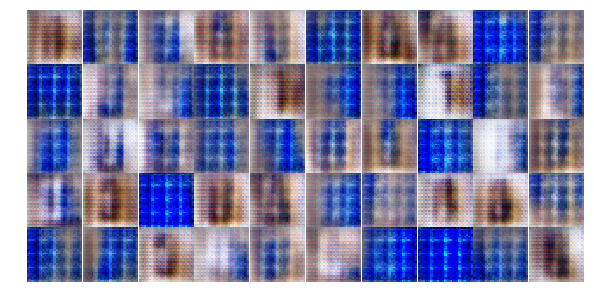

Epoch 1/25... Discriminator Loss: 1.1703... Generator Loss: 0.6630
Epoch 1/25... Discriminator Loss: 1.5968... Generator Loss: 0.4912
Epoch 1/25... Discriminator Loss: 0.8091... Generator Loss: 1.1124
Epoch 1/25... Discriminator Loss: 0.7614... Generator Loss: 1.4222
Epoch 1/25... Discriminator Loss: 1.7858... Generator Loss: 2.2919
Epoch 1/25... Discriminator Loss: 0.9959... Generator Loss: 1.1449
Epoch 1/25... Discriminator Loss: 1.3139... Generator Loss: 0.6027
Epoch 1/25... Discriminator Loss: 1.0171... Generator Loss: 1.2359
Epoch 1/25... Discriminator Loss: 2.4562... Generator Loss: 3.5402
Epoch 1/25... Discriminator Loss: 1.1208... Generator Loss: 0.8746


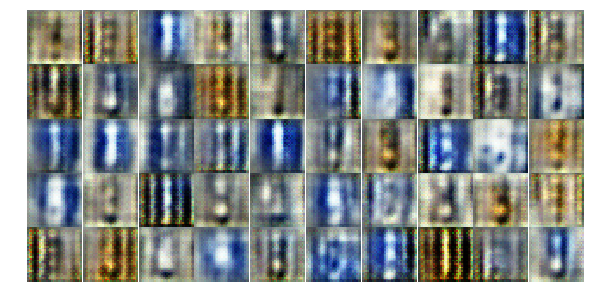

Epoch 1/25... Discriminator Loss: 4.5919... Generator Loss: 4.7896
Epoch 1/25... Discriminator Loss: 0.8923... Generator Loss: 1.1036
Epoch 1/25... Discriminator Loss: 0.9385... Generator Loss: 1.0759
Epoch 1/25... Discriminator Loss: 1.2671... Generator Loss: 1.0444
Epoch 1/25... Discriminator Loss: 1.4873... Generator Loss: 0.4225
Epoch 1/25... Discriminator Loss: 0.7525... Generator Loss: 1.8295
Epoch 1/25... Discriminator Loss: 1.2027... Generator Loss: 1.0235
Epoch 1/25... Discriminator Loss: 1.2591... Generator Loss: 0.6008
Epoch 1/25... Discriminator Loss: 1.2289... Generator Loss: 0.8515
Epoch 1/25... Discriminator Loss: 1.1763... Generator Loss: 0.9666


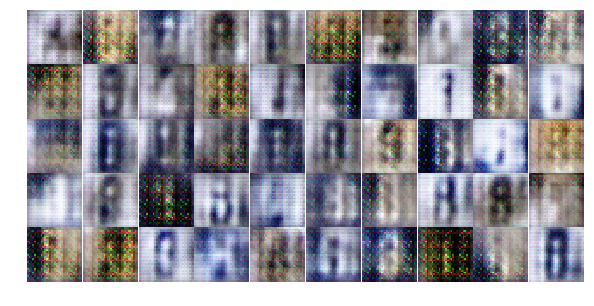

Epoch 1/25... Discriminator Loss: 1.1060... Generator Loss: 0.9349
Epoch 1/25... Discriminator Loss: 1.2541... Generator Loss: 0.9368
Epoch 1/25... Discriminator Loss: 1.2225... Generator Loss: 0.8315
Epoch 1/25... Discriminator Loss: 1.2483... Generator Loss: 0.8141
Epoch 1/25... Discriminator Loss: 1.0806... Generator Loss: 0.8411
Epoch 1/25... Discriminator Loss: 1.3578... Generator Loss: 0.8157
Epoch 1/25... Discriminator Loss: 1.2244... Generator Loss: 0.7512
Epoch 2/25... Discriminator Loss: 1.2310... Generator Loss: 0.7630
Epoch 2/25... Discriminator Loss: 1.2364... Generator Loss: 1.0218
Epoch 2/25... Discriminator Loss: 1.6004... Generator Loss: 0.5088


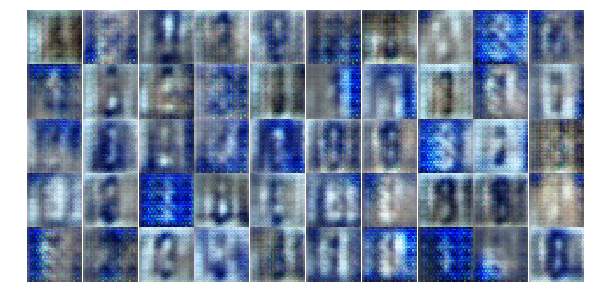

Epoch 2/25... Discriminator Loss: 1.4691... Generator Loss: 0.6888
Epoch 2/25... Discriminator Loss: 1.0640... Generator Loss: 0.9566
Epoch 2/25... Discriminator Loss: 1.2938... Generator Loss: 0.7942
Epoch 2/25... Discriminator Loss: 1.2384... Generator Loss: 0.7772
Epoch 2/25... Discriminator Loss: 1.2267... Generator Loss: 0.8322
Epoch 2/25... Discriminator Loss: 1.4190... Generator Loss: 0.7034
Epoch 2/25... Discriminator Loss: 1.1786... Generator Loss: 1.0395
Epoch 2/25... Discriminator Loss: 1.1587... Generator Loss: 0.9187
Epoch 2/25... Discriminator Loss: 1.3300... Generator Loss: 0.7104
Epoch 2/25... Discriminator Loss: 1.2757... Generator Loss: 0.9057


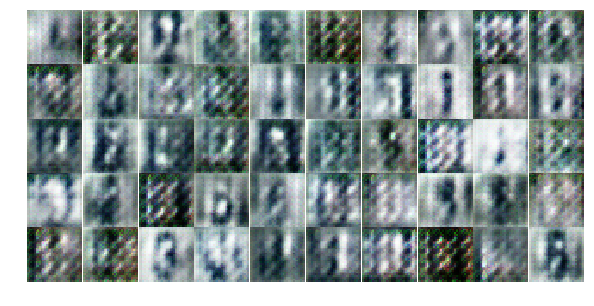

Epoch 2/25... Discriminator Loss: 1.1674... Generator Loss: 0.7664
Epoch 2/25... Discriminator Loss: 1.2842... Generator Loss: 1.0915
Epoch 2/25... Discriminator Loss: 1.1581... Generator Loss: 1.0769
Epoch 2/25... Discriminator Loss: 1.3256... Generator Loss: 0.6890
Epoch 2/25... Discriminator Loss: 1.1102... Generator Loss: 1.0173
Epoch 2/25... Discriminator Loss: 1.2682... Generator Loss: 0.6587
Epoch 2/25... Discriminator Loss: 1.5499... Generator Loss: 0.6902
Epoch 2/25... Discriminator Loss: 1.0279... Generator Loss: 0.7099
Epoch 2/25... Discriminator Loss: 1.1262... Generator Loss: 0.9345
Epoch 2/25... Discriminator Loss: 1.0606... Generator Loss: 1.0729


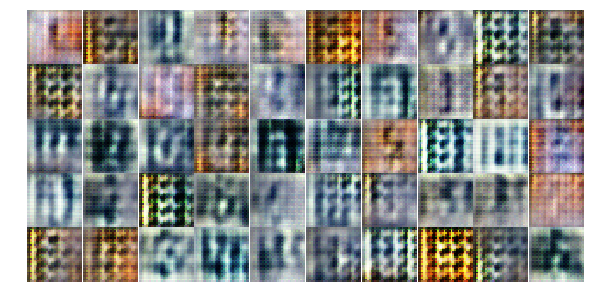

Epoch 2/25... Discriminator Loss: 1.1555... Generator Loss: 1.1859
Epoch 2/25... Discriminator Loss: 1.6744... Generator Loss: 0.6243
Epoch 2/25... Discriminator Loss: 1.1701... Generator Loss: 1.0289
Epoch 2/25... Discriminator Loss: 1.2124... Generator Loss: 0.9206
Epoch 2/25... Discriminator Loss: 1.2097... Generator Loss: 0.8492
Epoch 2/25... Discriminator Loss: 1.1088... Generator Loss: 0.8901
Epoch 2/25... Discriminator Loss: 1.3067... Generator Loss: 0.7496
Epoch 2/25... Discriminator Loss: 2.0258... Generator Loss: 0.2117
Epoch 2/25... Discriminator Loss: 1.1684... Generator Loss: 0.8069
Epoch 2/25... Discriminator Loss: 1.1168... Generator Loss: 0.9766


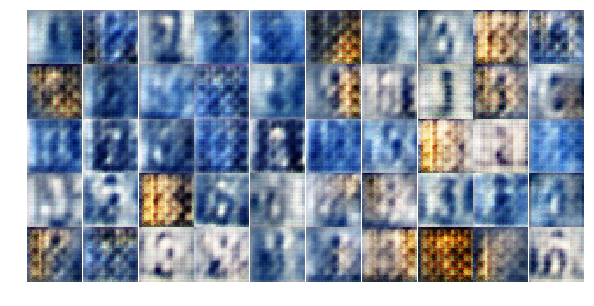

Epoch 2/25... Discriminator Loss: 1.3893... Generator Loss: 0.6257
Epoch 2/25... Discriminator Loss: 1.2656... Generator Loss: 0.9981
Epoch 2/25... Discriminator Loss: 1.2869... Generator Loss: 0.6282
Epoch 2/25... Discriminator Loss: 1.3501... Generator Loss: 0.6950
Epoch 2/25... Discriminator Loss: 1.1097... Generator Loss: 0.9718
Epoch 2/25... Discriminator Loss: 1.4253... Generator Loss: 0.6831
Epoch 2/25... Discriminator Loss: 1.2806... Generator Loss: 0.8595
Epoch 2/25... Discriminator Loss: 1.2883... Generator Loss: 0.9198
Epoch 2/25... Discriminator Loss: 1.3498... Generator Loss: 0.6743
Epoch 2/25... Discriminator Loss: 1.1666... Generator Loss: 1.0259


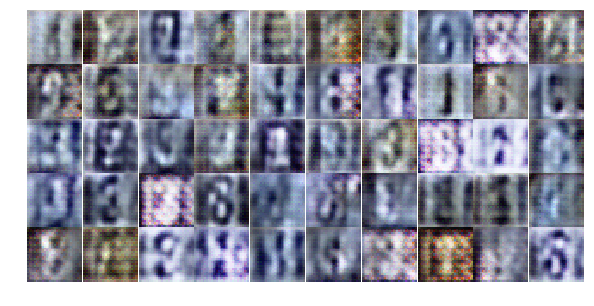

Epoch 2/25... Discriminator Loss: 0.9713... Generator Loss: 0.9738
Epoch 2/25... Discriminator Loss: 1.1352... Generator Loss: 1.0595
Epoch 2/25... Discriminator Loss: 1.5118... Generator Loss: 0.6998
Epoch 2/25... Discriminator Loss: 1.3622... Generator Loss: 0.6952
Epoch 2/25... Discriminator Loss: 1.1888... Generator Loss: 0.7680
Epoch 2/25... Discriminator Loss: 1.3008... Generator Loss: 0.7468
Epoch 2/25... Discriminator Loss: 1.4926... Generator Loss: 1.6705
Epoch 2/25... Discriminator Loss: 1.2538... Generator Loss: 1.2257
Epoch 2/25... Discriminator Loss: 1.2496... Generator Loss: 0.8407
Epoch 2/25... Discriminator Loss: 1.3251... Generator Loss: 0.8312


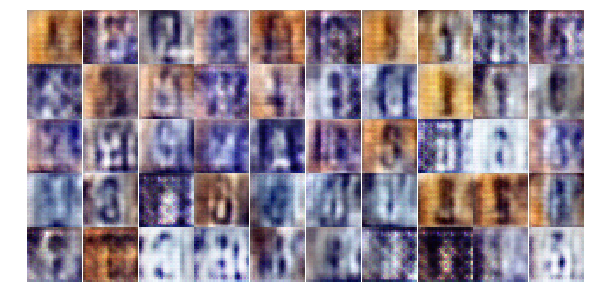

Epoch 2/25... Discriminator Loss: 1.3359... Generator Loss: 0.7880
Epoch 2/25... Discriminator Loss: 1.1268... Generator Loss: 1.0632
Epoch 2/25... Discriminator Loss: 1.1247... Generator Loss: 0.9171
Epoch 2/25... Discriminator Loss: 1.2468... Generator Loss: 0.8891
Epoch 3/25... Discriminator Loss: 1.4677... Generator Loss: 0.8074
Epoch 3/25... Discriminator Loss: 1.2058... Generator Loss: 0.8416
Epoch 3/25... Discriminator Loss: 1.4940... Generator Loss: 0.5914
Epoch 3/25... Discriminator Loss: 1.4715... Generator Loss: 0.5571
Epoch 3/25... Discriminator Loss: 1.0796... Generator Loss: 0.7421
Epoch 3/25... Discriminator Loss: 1.3663... Generator Loss: 0.6647


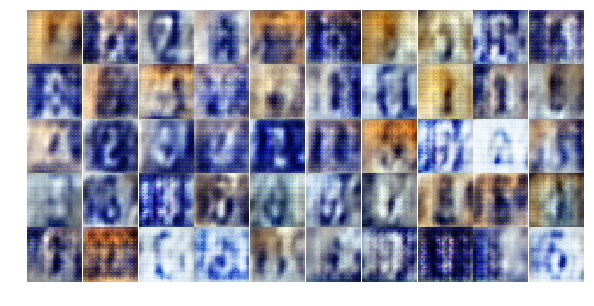

Epoch 3/25... Discriminator Loss: 1.3304... Generator Loss: 0.8824
Epoch 3/25... Discriminator Loss: 1.4400... Generator Loss: 0.6469
Epoch 3/25... Discriminator Loss: 1.3574... Generator Loss: 0.7297
Epoch 3/25... Discriminator Loss: 1.1734... Generator Loss: 0.8228
Epoch 3/25... Discriminator Loss: 1.4713... Generator Loss: 0.6743
Epoch 3/25... Discriminator Loss: 1.1354... Generator Loss: 1.6993
Epoch 3/25... Discriminator Loss: 1.1186... Generator Loss: 0.9144
Epoch 3/25... Discriminator Loss: 1.6130... Generator Loss: 0.5937
Epoch 3/25... Discriminator Loss: 1.1901... Generator Loss: 0.7491
Epoch 3/25... Discriminator Loss: 1.4820... Generator Loss: 0.5907


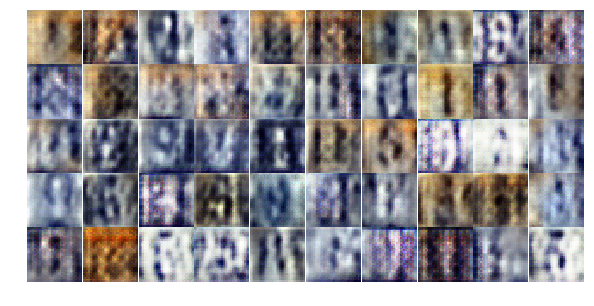

Epoch 3/25... Discriminator Loss: 1.5037... Generator Loss: 0.6788
Epoch 3/25... Discriminator Loss: 1.3390... Generator Loss: 0.7909
Epoch 3/25... Discriminator Loss: 1.4920... Generator Loss: 0.9880
Epoch 3/25... Discriminator Loss: 1.3550... Generator Loss: 1.0922
Epoch 3/25... Discriminator Loss: 0.9639... Generator Loss: 0.8598
Epoch 3/25... Discriminator Loss: 1.1270... Generator Loss: 0.9142
Epoch 3/25... Discriminator Loss: 1.3724... Generator Loss: 0.4861
Epoch 3/25... Discriminator Loss: 1.2126... Generator Loss: 0.6949
Epoch 3/25... Discriminator Loss: 1.2562... Generator Loss: 0.8010
Epoch 3/25... Discriminator Loss: 1.3329... Generator Loss: 0.7882


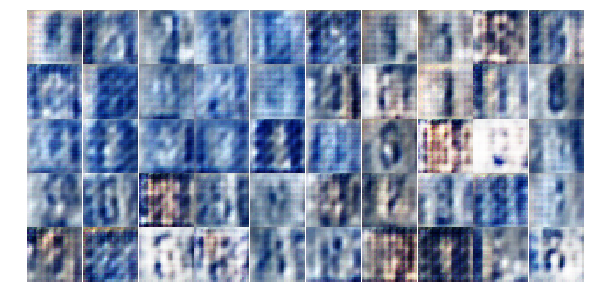

Epoch 3/25... Discriminator Loss: 1.2718... Generator Loss: 0.7997
Epoch 3/25... Discriminator Loss: 1.2729... Generator Loss: 0.7886
Epoch 3/25... Discriminator Loss: 1.5375... Generator Loss: 0.5632
Epoch 3/25... Discriminator Loss: 1.4173... Generator Loss: 0.6040
Epoch 3/25... Discriminator Loss: 1.4104... Generator Loss: 0.8084
Epoch 3/25... Discriminator Loss: 1.2188... Generator Loss: 0.7888
Epoch 3/25... Discriminator Loss: 1.2785... Generator Loss: 0.7373
Epoch 3/25... Discriminator Loss: 1.4844... Generator Loss: 0.6586
Epoch 3/25... Discriminator Loss: 1.1855... Generator Loss: 0.9048
Epoch 3/25... Discriminator Loss: 1.3765... Generator Loss: 0.6666


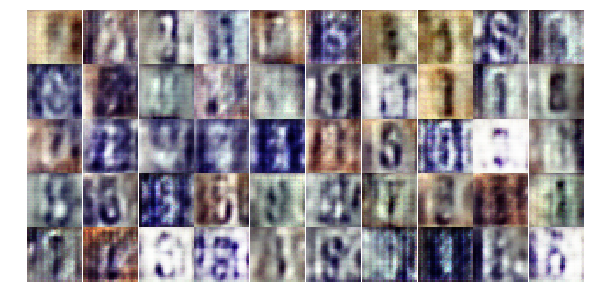

Epoch 3/25... Discriminator Loss: 1.2467... Generator Loss: 0.7244
Epoch 3/25... Discriminator Loss: 1.2633... Generator Loss: 0.8160
Epoch 3/25... Discriminator Loss: 1.3736... Generator Loss: 0.6928
Epoch 3/25... Discriminator Loss: 1.2419... Generator Loss: 0.8932
Epoch 3/25... Discriminator Loss: 1.3326... Generator Loss: 0.6636
Epoch 3/25... Discriminator Loss: 1.3487... Generator Loss: 0.5824
Epoch 3/25... Discriminator Loss: 1.2781... Generator Loss: 0.8444
Epoch 3/25... Discriminator Loss: 1.2936... Generator Loss: 0.7051
Epoch 3/25... Discriminator Loss: 1.1822... Generator Loss: 0.8923
Epoch 3/25... Discriminator Loss: 1.3953... Generator Loss: 0.6720


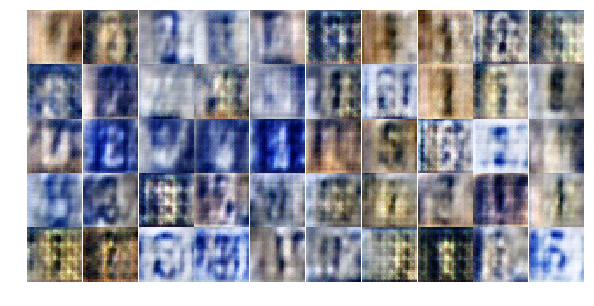

Epoch 3/25... Discriminator Loss: 1.2836... Generator Loss: 0.6934
Epoch 3/25... Discriminator Loss: 1.3026... Generator Loss: 0.9469
Epoch 3/25... Discriminator Loss: 1.1622... Generator Loss: 0.8632
Epoch 3/25... Discriminator Loss: 1.2257... Generator Loss: 0.9928
Epoch 3/25... Discriminator Loss: 1.1720... Generator Loss: 1.0653
Epoch 3/25... Discriminator Loss: 1.1907... Generator Loss: 0.7935
Epoch 3/25... Discriminator Loss: 1.3248... Generator Loss: 0.6770
Epoch 3/25... Discriminator Loss: 1.2795... Generator Loss: 0.8655
Epoch 3/25... Discriminator Loss: 1.3346... Generator Loss: 0.7502
Epoch 3/25... Discriminator Loss: 1.3216... Generator Loss: 0.7257


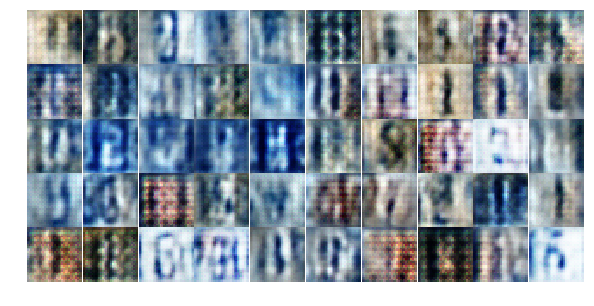

Epoch 3/25... Discriminator Loss: 1.4068... Generator Loss: 0.7407
Epoch 4/25... Discriminator Loss: 1.4382... Generator Loss: 0.7740
Epoch 4/25... Discriminator Loss: 1.2163... Generator Loss: 1.0173
Epoch 4/25... Discriminator Loss: 1.5452... Generator Loss: 0.8447
Epoch 4/25... Discriminator Loss: 1.1437... Generator Loss: 0.8085
Epoch 4/25... Discriminator Loss: 1.2641... Generator Loss: 0.8016
Epoch 4/25... Discriminator Loss: 1.4684... Generator Loss: 0.4879
Epoch 4/25... Discriminator Loss: 1.2991... Generator Loss: 0.9071
Epoch 4/25... Discriminator Loss: 1.4083... Generator Loss: 0.8933
Epoch 4/25... Discriminator Loss: 1.1543... Generator Loss: 0.7661


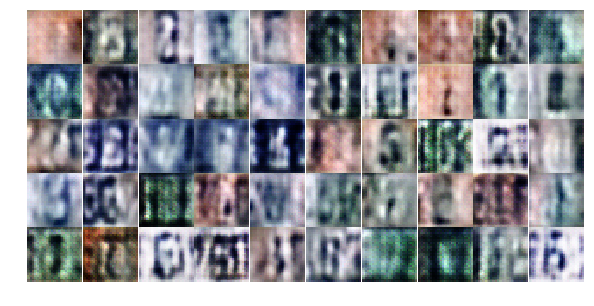

Epoch 4/25... Discriminator Loss: 1.3388... Generator Loss: 0.7467
Epoch 4/25... Discriminator Loss: 1.1627... Generator Loss: 0.7067
Epoch 4/25... Discriminator Loss: 1.3001... Generator Loss: 0.6934
Epoch 4/25... Discriminator Loss: 1.0535... Generator Loss: 1.0098
Epoch 4/25... Discriminator Loss: 1.6107... Generator Loss: 0.4701
Epoch 4/25... Discriminator Loss: 1.3715... Generator Loss: 0.7361
Epoch 4/25... Discriminator Loss: 1.2664... Generator Loss: 0.7206
Epoch 4/25... Discriminator Loss: 1.1258... Generator Loss: 1.1843
Epoch 4/25... Discriminator Loss: 1.2225... Generator Loss: 0.9899
Epoch 4/25... Discriminator Loss: 1.2703... Generator Loss: 1.2640


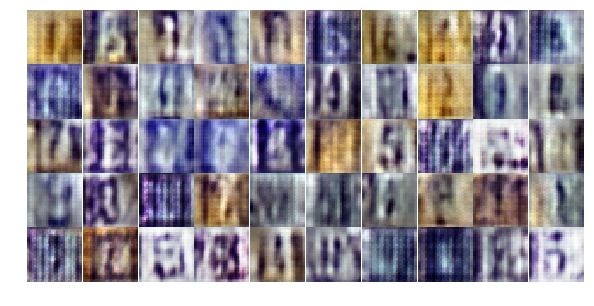

Epoch 4/25... Discriminator Loss: 1.3266... Generator Loss: 0.7313
Epoch 4/25... Discriminator Loss: 1.0444... Generator Loss: 0.8057
Epoch 4/25... Discriminator Loss: 1.2518... Generator Loss: 0.8672
Epoch 4/25... Discriminator Loss: 1.2281... Generator Loss: 0.6294
Epoch 4/25... Discriminator Loss: 1.2869... Generator Loss: 0.7422
Epoch 4/25... Discriminator Loss: 1.3333... Generator Loss: 0.8569
Epoch 4/25... Discriminator Loss: 1.2418... Generator Loss: 0.8312
Epoch 4/25... Discriminator Loss: 1.2575... Generator Loss: 0.7080
Epoch 4/25... Discriminator Loss: 1.2853... Generator Loss: 0.8925
Epoch 4/25... Discriminator Loss: 0.9875... Generator Loss: 1.1411


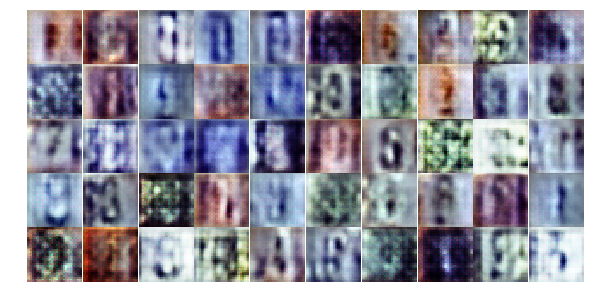

Epoch 4/25... Discriminator Loss: 1.3121... Generator Loss: 0.7882
Epoch 4/25... Discriminator Loss: 1.3473... Generator Loss: 1.2131
Epoch 4/25... Discriminator Loss: 1.0675... Generator Loss: 0.8082
Epoch 4/25... Discriminator Loss: 1.1289... Generator Loss: 0.9992
Epoch 4/25... Discriminator Loss: 1.1618... Generator Loss: 0.8831
Epoch 4/25... Discriminator Loss: 1.2801... Generator Loss: 1.0353
Epoch 4/25... Discriminator Loss: 1.2904... Generator Loss: 0.7006
Epoch 4/25... Discriminator Loss: 1.3102... Generator Loss: 0.7602
Epoch 4/25... Discriminator Loss: 1.1564... Generator Loss: 0.8252
Epoch 4/25... Discriminator Loss: 0.8512... Generator Loss: 1.3322


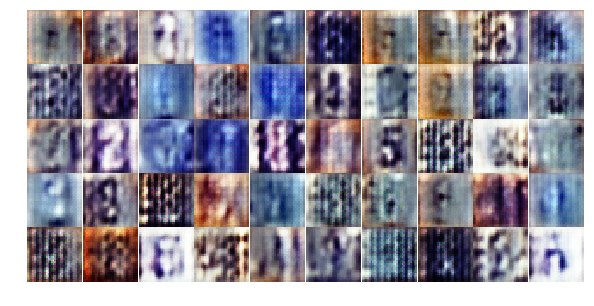

Epoch 4/25... Discriminator Loss: 1.3141... Generator Loss: 0.6719
Epoch 4/25... Discriminator Loss: 1.0861... Generator Loss: 1.0757
Epoch 4/25... Discriminator Loss: 1.2904... Generator Loss: 0.7478
Epoch 4/25... Discriminator Loss: 1.4367... Generator Loss: 0.9838
Epoch 4/25... Discriminator Loss: 1.2338... Generator Loss: 0.8324
Epoch 4/25... Discriminator Loss: 1.1289... Generator Loss: 1.0042
Epoch 4/25... Discriminator Loss: 1.1028... Generator Loss: 1.0466
Epoch 4/25... Discriminator Loss: 1.1117... Generator Loss: 0.8709
Epoch 4/25... Discriminator Loss: 1.1676... Generator Loss: 0.8609
Epoch 4/25... Discriminator Loss: 1.1325... Generator Loss: 0.9224


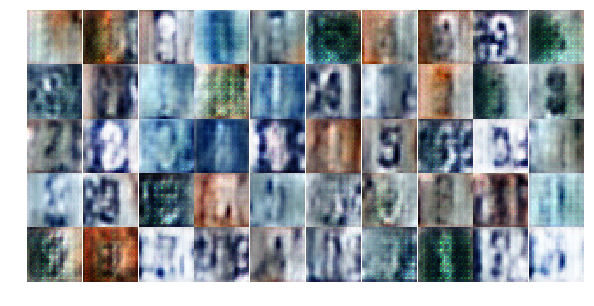

Epoch 4/25... Discriminator Loss: 1.2756... Generator Loss: 0.7388
Epoch 4/25... Discriminator Loss: 1.4251... Generator Loss: 1.5931
Epoch 4/25... Discriminator Loss: 1.1233... Generator Loss: 1.1107
Epoch 4/25... Discriminator Loss: 1.0563... Generator Loss: 1.1473
Epoch 4/25... Discriminator Loss: 0.9770... Generator Loss: 0.7545
Epoch 4/25... Discriminator Loss: 1.7118... Generator Loss: 2.2401
Epoch 4/25... Discriminator Loss: 1.1047... Generator Loss: 0.7953
Epoch 4/25... Discriminator Loss: 1.1417... Generator Loss: 1.0260
Epoch 4/25... Discriminator Loss: 1.0697... Generator Loss: 1.1651
Epoch 5/25... Discriminator Loss: 1.1947... Generator Loss: 1.6347


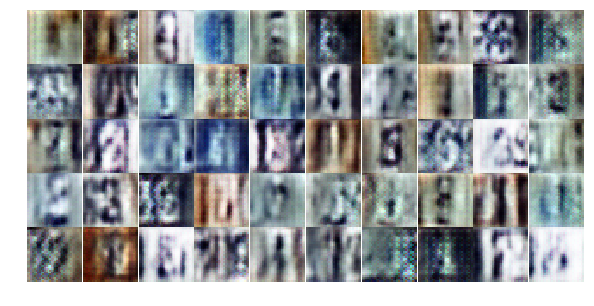

Epoch 5/25... Discriminator Loss: 1.1212... Generator Loss: 0.8202
Epoch 5/25... Discriminator Loss: 1.0842... Generator Loss: 0.8397
Epoch 5/25... Discriminator Loss: 0.9323... Generator Loss: 1.4266
Epoch 5/25... Discriminator Loss: 1.0149... Generator Loss: 0.7763
Epoch 5/25... Discriminator Loss: 1.1327... Generator Loss: 0.8957
Epoch 5/25... Discriminator Loss: 1.3588... Generator Loss: 0.6151
Epoch 5/25... Discriminator Loss: 1.0552... Generator Loss: 1.1609
Epoch 5/25... Discriminator Loss: 1.1405... Generator Loss: 0.7950
Epoch 5/25... Discriminator Loss: 1.1901... Generator Loss: 0.6667
Epoch 5/25... Discriminator Loss: 1.5633... Generator Loss: 0.3573


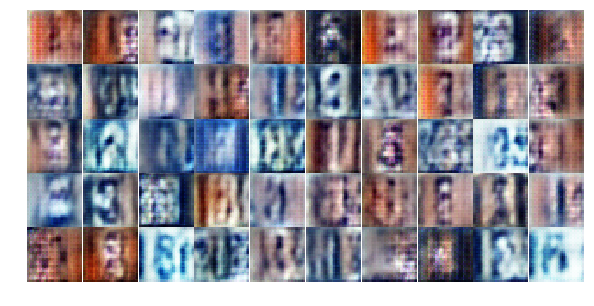

Epoch 5/25... Discriminator Loss: 1.3523... Generator Loss: 0.4961
Epoch 5/25... Discriminator Loss: 1.2735... Generator Loss: 0.6016
Epoch 5/25... Discriminator Loss: 1.2426... Generator Loss: 1.7327
Epoch 5/25... Discriminator Loss: 1.3857... Generator Loss: 0.7576
Epoch 5/25... Discriminator Loss: 1.4306... Generator Loss: 1.3245
Epoch 5/25... Discriminator Loss: 0.9328... Generator Loss: 1.0333
Epoch 5/25... Discriminator Loss: 0.8926... Generator Loss: 0.8956
Epoch 5/25... Discriminator Loss: 1.1065... Generator Loss: 0.9644
Epoch 5/25... Discriminator Loss: 1.0952... Generator Loss: 0.7548
Epoch 5/25... Discriminator Loss: 1.2026... Generator Loss: 0.7034


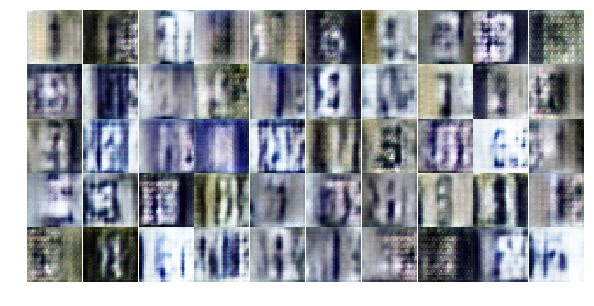

Epoch 5/25... Discriminator Loss: 1.1393... Generator Loss: 0.6865
Epoch 5/25... Discriminator Loss: 1.2024... Generator Loss: 1.0505
Epoch 5/25... Discriminator Loss: 1.1434... Generator Loss: 0.7463
Epoch 5/25... Discriminator Loss: 1.2243... Generator Loss: 0.5672
Epoch 5/25... Discriminator Loss: 1.3669... Generator Loss: 0.4225
Epoch 5/25... Discriminator Loss: 1.2591... Generator Loss: 0.7135
Epoch 5/25... Discriminator Loss: 1.2571... Generator Loss: 0.6755
Epoch 5/25... Discriminator Loss: 1.3073... Generator Loss: 0.5913
Epoch 5/25... Discriminator Loss: 1.1142... Generator Loss: 0.8957
Epoch 5/25... Discriminator Loss: 1.1908... Generator Loss: 1.2832


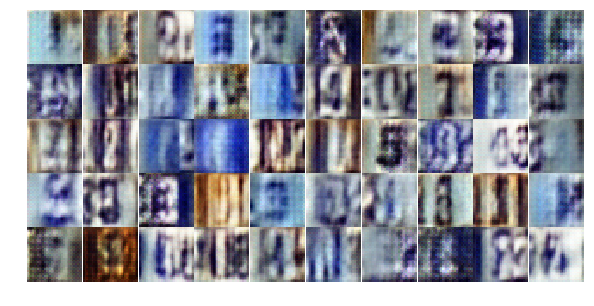

Epoch 5/25... Discriminator Loss: 1.1326... Generator Loss: 0.8437
Epoch 5/25... Discriminator Loss: 1.3327... Generator Loss: 0.5906
Epoch 5/25... Discriminator Loss: 1.1851... Generator Loss: 1.0572
Epoch 5/25... Discriminator Loss: 1.0620... Generator Loss: 0.9961
Epoch 5/25... Discriminator Loss: 1.1586... Generator Loss: 0.8697
Epoch 5/25... Discriminator Loss: 1.0177... Generator Loss: 1.1326
Epoch 5/25... Discriminator Loss: 1.2852... Generator Loss: 0.5008
Epoch 5/25... Discriminator Loss: 1.2045... Generator Loss: 0.6767
Epoch 5/25... Discriminator Loss: 1.3648... Generator Loss: 0.5588
Epoch 5/25... Discriminator Loss: 1.1952... Generator Loss: 0.7948


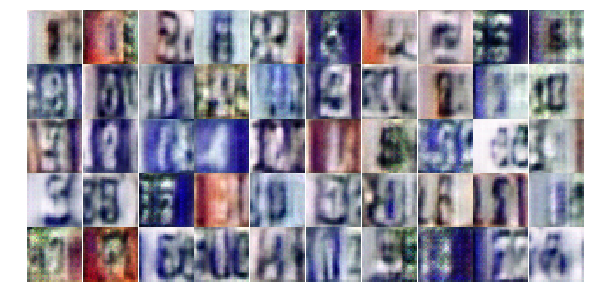

Epoch 5/25... Discriminator Loss: 1.2268... Generator Loss: 0.7306
Epoch 5/25... Discriminator Loss: 1.0369... Generator Loss: 0.6594
Epoch 5/25... Discriminator Loss: 1.4031... Generator Loss: 0.4388
Epoch 5/25... Discriminator Loss: 1.1180... Generator Loss: 1.1472
Epoch 5/25... Discriminator Loss: 1.2297... Generator Loss: 0.8840
Epoch 5/25... Discriminator Loss: 1.4338... Generator Loss: 0.4415
Epoch 5/25... Discriminator Loss: 0.8853... Generator Loss: 1.2404
Epoch 5/25... Discriminator Loss: 1.5775... Generator Loss: 1.6104
Epoch 5/25... Discriminator Loss: 1.5524... Generator Loss: 0.3655
Epoch 5/25... Discriminator Loss: 1.5468... Generator Loss: 1.0218


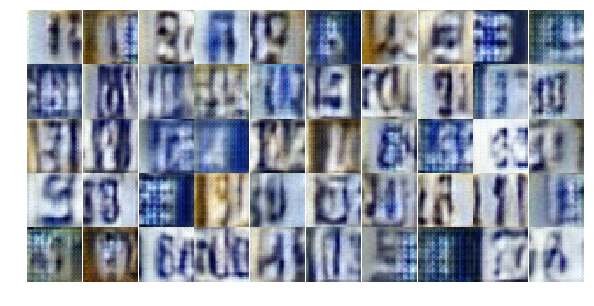

Epoch 5/25... Discriminator Loss: 1.3828... Generator Loss: 0.5589
Epoch 5/25... Discriminator Loss: 1.5988... Generator Loss: 0.4598
Epoch 5/25... Discriminator Loss: 1.2529... Generator Loss: 0.6541
Epoch 5/25... Discriminator Loss: 1.3586... Generator Loss: 0.4916
Epoch 5/25... Discriminator Loss: 1.1522... Generator Loss: 1.4251
Epoch 5/25... Discriminator Loss: 1.1991... Generator Loss: 0.8007
Epoch 6/25... Discriminator Loss: 1.1890... Generator Loss: 0.8544
Epoch 6/25... Discriminator Loss: 1.4457... Generator Loss: 0.4305
Epoch 6/25... Discriminator Loss: 1.3305... Generator Loss: 0.5669
Epoch 6/25... Discriminator Loss: 1.3233... Generator Loss: 0.4995


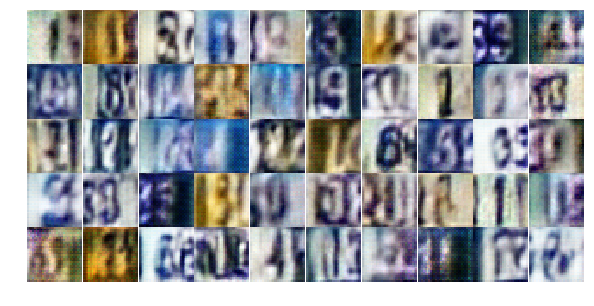

Epoch 6/25... Discriminator Loss: 1.2794... Generator Loss: 0.7365
Epoch 6/25... Discriminator Loss: 1.2387... Generator Loss: 0.7799
Epoch 6/25... Discriminator Loss: 1.1047... Generator Loss: 0.9702
Epoch 6/25... Discriminator Loss: 1.5183... Generator Loss: 0.3894
Epoch 6/25... Discriminator Loss: 1.6069... Generator Loss: 1.9664
Epoch 6/25... Discriminator Loss: 0.9718... Generator Loss: 0.8675
Epoch 6/25... Discriminator Loss: 1.2433... Generator Loss: 0.9568
Epoch 6/25... Discriminator Loss: 1.4998... Generator Loss: 0.5805
Epoch 6/25... Discriminator Loss: 1.0762... Generator Loss: 0.6903
Epoch 6/25... Discriminator Loss: 1.2365... Generator Loss: 0.5790


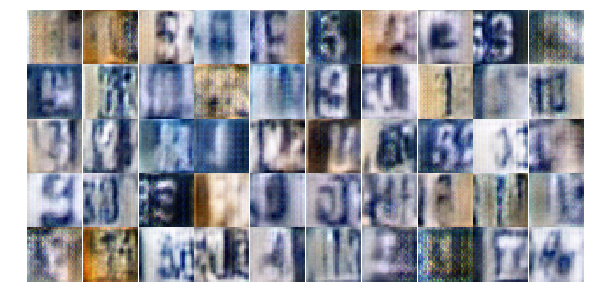

Epoch 6/25... Discriminator Loss: 1.0627... Generator Loss: 1.0856
Epoch 6/25... Discriminator Loss: 1.2149... Generator Loss: 0.6935
Epoch 6/25... Discriminator Loss: 1.1949... Generator Loss: 0.7445
Epoch 6/25... Discriminator Loss: 0.8657... Generator Loss: 0.9051
Epoch 6/25... Discriminator Loss: 0.8932... Generator Loss: 1.1229
Epoch 6/25... Discriminator Loss: 1.0432... Generator Loss: 0.9416
Epoch 6/25... Discriminator Loss: 0.9689... Generator Loss: 0.8181
Epoch 6/25... Discriminator Loss: 1.1643... Generator Loss: 1.1783
Epoch 6/25... Discriminator Loss: 1.1286... Generator Loss: 0.7707
Epoch 6/25... Discriminator Loss: 1.3423... Generator Loss: 0.4983


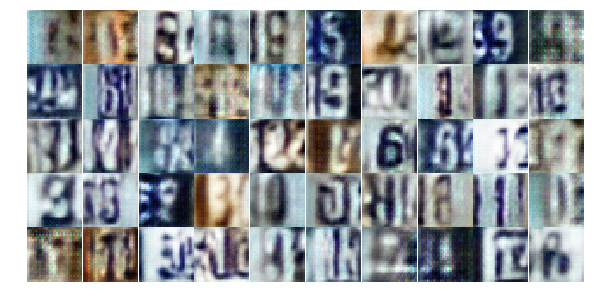

Epoch 6/25... Discriminator Loss: 1.2731... Generator Loss: 0.7037
Epoch 6/25... Discriminator Loss: 1.0204... Generator Loss: 0.6634
Epoch 6/25... Discriminator Loss: 1.3694... Generator Loss: 0.4401
Epoch 6/25... Discriminator Loss: 1.1076... Generator Loss: 0.6577
Epoch 6/25... Discriminator Loss: 1.3264... Generator Loss: 1.0849
Epoch 6/25... Discriminator Loss: 1.6240... Generator Loss: 0.3481
Epoch 6/25... Discriminator Loss: 1.1821... Generator Loss: 0.6824
Epoch 6/25... Discriminator Loss: 1.0235... Generator Loss: 1.0688
Epoch 6/25... Discriminator Loss: 1.2629... Generator Loss: 0.6579
Epoch 6/25... Discriminator Loss: 1.0585... Generator Loss: 0.9724


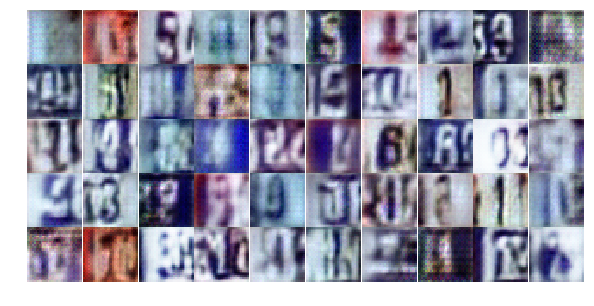

Epoch 6/25... Discriminator Loss: 1.6287... Generator Loss: 0.2965
Epoch 6/25... Discriminator Loss: 1.2882... Generator Loss: 1.0648
Epoch 6/25... Discriminator Loss: 1.0145... Generator Loss: 0.9234
Epoch 6/25... Discriminator Loss: 1.2164... Generator Loss: 0.5447
Epoch 6/25... Discriminator Loss: 1.1806... Generator Loss: 0.5814
Epoch 6/25... Discriminator Loss: 1.4943... Generator Loss: 0.4490
Epoch 6/25... Discriminator Loss: 1.3917... Generator Loss: 0.6216
Epoch 6/25... Discriminator Loss: 1.0979... Generator Loss: 1.1627
Epoch 6/25... Discriminator Loss: 1.1126... Generator Loss: 0.9489
Epoch 6/25... Discriminator Loss: 1.0805... Generator Loss: 0.6327


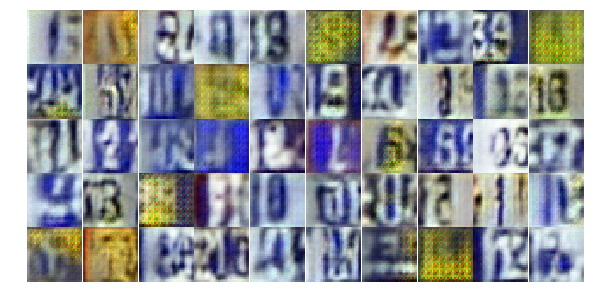

Epoch 6/25... Discriminator Loss: 1.1929... Generator Loss: 1.1379
Epoch 6/25... Discriminator Loss: 1.3255... Generator Loss: 0.4608
Epoch 6/25... Discriminator Loss: 1.4005... Generator Loss: 0.4839
Epoch 6/25... Discriminator Loss: 1.2989... Generator Loss: 0.7084
Epoch 6/25... Discriminator Loss: 1.1259... Generator Loss: 0.7208
Epoch 6/25... Discriminator Loss: 1.1244... Generator Loss: 0.8505
Epoch 6/25... Discriminator Loss: 1.3569... Generator Loss: 0.4697
Epoch 6/25... Discriminator Loss: 1.7269... Generator Loss: 0.2987
Epoch 6/25... Discriminator Loss: 1.2561... Generator Loss: 0.8021
Epoch 6/25... Discriminator Loss: 1.4350... Generator Loss: 0.4631


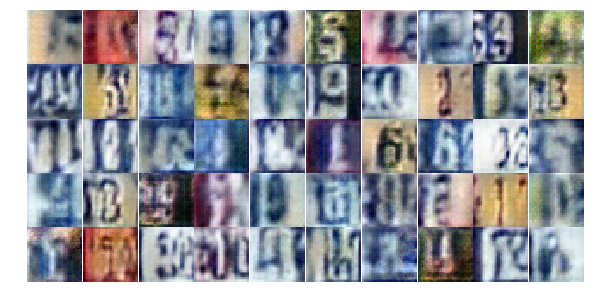

Epoch 6/25... Discriminator Loss: 0.9184... Generator Loss: 0.9987
Epoch 6/25... Discriminator Loss: 1.1222... Generator Loss: 0.6866
Epoch 6/25... Discriminator Loss: 1.2309... Generator Loss: 0.7790
Epoch 7/25... Discriminator Loss: 1.0672... Generator Loss: 1.0688
Epoch 7/25... Discriminator Loss: 1.2693... Generator Loss: 0.7987
Epoch 7/25... Discriminator Loss: 1.1230... Generator Loss: 0.6508
Epoch 7/25... Discriminator Loss: 1.1695... Generator Loss: 0.6789
Epoch 7/25... Discriminator Loss: 1.2075... Generator Loss: 0.9476
Epoch 7/25... Discriminator Loss: 1.0508... Generator Loss: 1.3221
Epoch 7/25... Discriminator Loss: 1.0493... Generator Loss: 0.7847


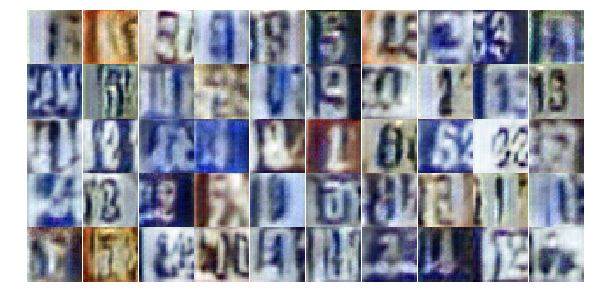

Epoch 7/25... Discriminator Loss: 1.0200... Generator Loss: 1.0322
Epoch 7/25... Discriminator Loss: 1.3801... Generator Loss: 1.4358
Epoch 7/25... Discriminator Loss: 1.0028... Generator Loss: 1.1237
Epoch 7/25... Discriminator Loss: 1.1682... Generator Loss: 0.6909
Epoch 7/25... Discriminator Loss: 1.1887... Generator Loss: 0.7914
Epoch 7/25... Discriminator Loss: 1.1746... Generator Loss: 0.5977
Epoch 7/25... Discriminator Loss: 1.2944... Generator Loss: 0.9997
Epoch 7/25... Discriminator Loss: 1.2813... Generator Loss: 1.3816
Epoch 7/25... Discriminator Loss: 1.3021... Generator Loss: 0.8267
Epoch 7/25... Discriminator Loss: 1.3279... Generator Loss: 0.9545


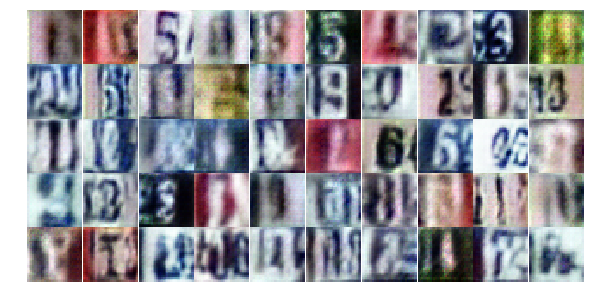

Epoch 7/25... Discriminator Loss: 1.2830... Generator Loss: 0.6585
Epoch 7/25... Discriminator Loss: 1.1407... Generator Loss: 0.6259
Epoch 7/25... Discriminator Loss: 1.3633... Generator Loss: 0.4834
Epoch 7/25... Discriminator Loss: 1.1931... Generator Loss: 0.6968
Epoch 7/25... Discriminator Loss: 0.9649... Generator Loss: 1.4649
Epoch 7/25... Discriminator Loss: 0.9984... Generator Loss: 1.2215
Epoch 7/25... Discriminator Loss: 1.3536... Generator Loss: 0.4548
Epoch 7/25... Discriminator Loss: 1.5419... Generator Loss: 0.3375
Epoch 7/25... Discriminator Loss: 1.1004... Generator Loss: 0.6965
Epoch 7/25... Discriminator Loss: 1.3743... Generator Loss: 2.0260


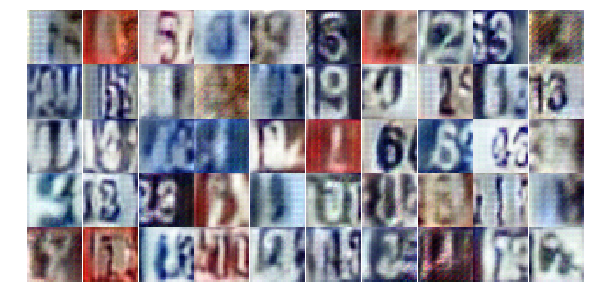

Epoch 7/25... Discriminator Loss: 1.3864... Generator Loss: 0.4355
Epoch 7/25... Discriminator Loss: 1.2169... Generator Loss: 1.1632
Epoch 7/25... Discriminator Loss: 1.0189... Generator Loss: 0.7946
Epoch 7/25... Discriminator Loss: 1.2457... Generator Loss: 1.1325
Epoch 7/25... Discriminator Loss: 1.2270... Generator Loss: 1.1644
Epoch 7/25... Discriminator Loss: 1.1157... Generator Loss: 0.6281
Epoch 7/25... Discriminator Loss: 1.1901... Generator Loss: 0.4808
Epoch 7/25... Discriminator Loss: 1.6243... Generator Loss: 0.3403
Epoch 7/25... Discriminator Loss: 1.4328... Generator Loss: 0.9104
Epoch 7/25... Discriminator Loss: 2.0089... Generator Loss: 0.2333


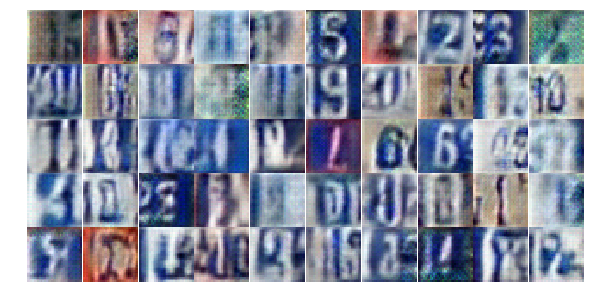

Epoch 7/25... Discriminator Loss: 1.0412... Generator Loss: 0.8992
Epoch 7/25... Discriminator Loss: 1.3596... Generator Loss: 0.5536
Epoch 7/25... Discriminator Loss: 1.1707... Generator Loss: 1.2296
Epoch 7/25... Discriminator Loss: 1.0957... Generator Loss: 0.7012
Epoch 7/25... Discriminator Loss: 1.0277... Generator Loss: 0.8605
Epoch 7/25... Discriminator Loss: 0.9550... Generator Loss: 1.0982
Epoch 7/25... Discriminator Loss: 1.2440... Generator Loss: 0.5538
Epoch 7/25... Discriminator Loss: 1.2750... Generator Loss: 0.8277
Epoch 7/25... Discriminator Loss: 0.9774... Generator Loss: 1.0021
Epoch 7/25... Discriminator Loss: 1.3889... Generator Loss: 1.1282


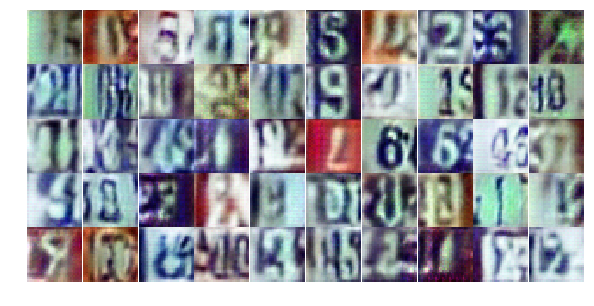

Epoch 7/25... Discriminator Loss: 1.1392... Generator Loss: 0.8715
Epoch 7/25... Discriminator Loss: 1.2135... Generator Loss: 0.7130
Epoch 7/25... Discriminator Loss: 0.9729... Generator Loss: 0.9396
Epoch 7/25... Discriminator Loss: 1.2090... Generator Loss: 0.8657
Epoch 7/25... Discriminator Loss: 0.7185... Generator Loss: 1.2930
Epoch 7/25... Discriminator Loss: 1.2442... Generator Loss: 1.0956
Epoch 7/25... Discriminator Loss: 1.1799... Generator Loss: 0.7681
Epoch 7/25... Discriminator Loss: 1.1314... Generator Loss: 1.0290
Epoch 7/25... Discriminator Loss: 1.2653... Generator Loss: 0.6800
Epoch 7/25... Discriminator Loss: 1.0120... Generator Loss: 0.8779


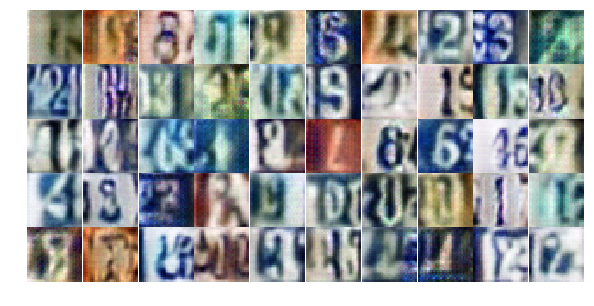

Epoch 7/25... Discriminator Loss: 1.0591... Generator Loss: 0.7795
Epoch 8/25... Discriminator Loss: 1.4462... Generator Loss: 0.4102
Epoch 8/25... Discriminator Loss: 1.1739... Generator Loss: 0.5388
Epoch 8/25... Discriminator Loss: 1.0059... Generator Loss: 0.8070
Epoch 8/25... Discriminator Loss: 1.0253... Generator Loss: 0.8536
Epoch 8/25... Discriminator Loss: 1.3571... Generator Loss: 0.6477
Epoch 8/25... Discriminator Loss: 1.2834... Generator Loss: 0.4871
Epoch 8/25... Discriminator Loss: 1.1102... Generator Loss: 0.8238
Epoch 8/25... Discriminator Loss: 1.2265... Generator Loss: 0.5306
Epoch 8/25... Discriminator Loss: 1.0947... Generator Loss: 1.2318


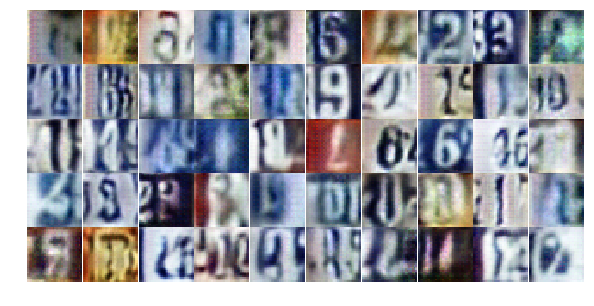

Epoch 8/25... Discriminator Loss: 0.9492... Generator Loss: 0.9786
Epoch 8/25... Discriminator Loss: 1.3167... Generator Loss: 0.5314
Epoch 8/25... Discriminator Loss: 1.2804... Generator Loss: 0.4747
Epoch 8/25... Discriminator Loss: 1.0696... Generator Loss: 1.0670
Epoch 8/25... Discriminator Loss: 1.1446... Generator Loss: 0.6333
Epoch 8/25... Discriminator Loss: 1.1496... Generator Loss: 1.0823
Epoch 8/25... Discriminator Loss: 1.1179... Generator Loss: 0.6218
Epoch 8/25... Discriminator Loss: 1.2270... Generator Loss: 0.7512
Epoch 8/25... Discriminator Loss: 1.3068... Generator Loss: 1.5430
Epoch 8/25... Discriminator Loss: 1.7874... Generator Loss: 0.2840


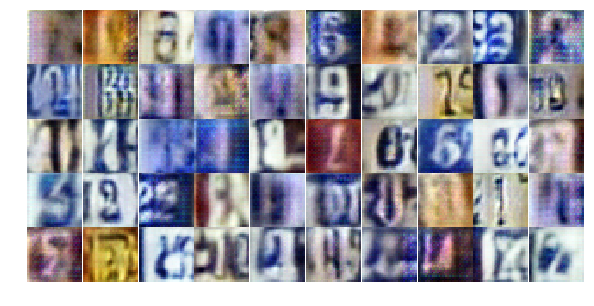

Epoch 8/25... Discriminator Loss: 1.0349... Generator Loss: 0.7864
Epoch 8/25... Discriminator Loss: 0.9917... Generator Loss: 0.6756
Epoch 8/25... Discriminator Loss: 0.9549... Generator Loss: 0.8737
Epoch 8/25... Discriminator Loss: 1.2109... Generator Loss: 0.6578
Epoch 8/25... Discriminator Loss: 1.0089... Generator Loss: 0.8812
Epoch 8/25... Discriminator Loss: 1.1426... Generator Loss: 0.7650
Epoch 8/25... Discriminator Loss: 1.2872... Generator Loss: 0.5821
Epoch 8/25... Discriminator Loss: 0.8938... Generator Loss: 0.8976
Epoch 8/25... Discriminator Loss: 1.0435... Generator Loss: 0.9445
Epoch 8/25... Discriminator Loss: 1.0984... Generator Loss: 0.6765


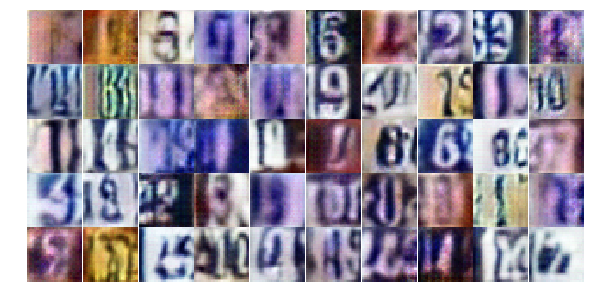

Epoch 8/25... Discriminator Loss: 1.0671... Generator Loss: 1.1365
Epoch 8/25... Discriminator Loss: 1.5365... Generator Loss: 0.3384
Epoch 8/25... Discriminator Loss: 1.0424... Generator Loss: 1.5650
Epoch 8/25... Discriminator Loss: 1.6199... Generator Loss: 0.3100
Epoch 8/25... Discriminator Loss: 1.3312... Generator Loss: 0.4271
Epoch 8/25... Discriminator Loss: 0.9227... Generator Loss: 0.7707
Epoch 8/25... Discriminator Loss: 1.1926... Generator Loss: 1.8534
Epoch 8/25... Discriminator Loss: 0.9994... Generator Loss: 1.0079
Epoch 8/25... Discriminator Loss: 1.1427... Generator Loss: 0.6582
Epoch 8/25... Discriminator Loss: 1.1713... Generator Loss: 0.5523


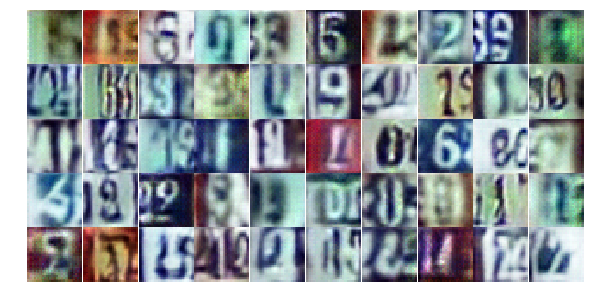

Epoch 8/25... Discriminator Loss: 0.9161... Generator Loss: 1.2192
Epoch 8/25... Discriminator Loss: 1.4742... Generator Loss: 1.0510
Epoch 8/25... Discriminator Loss: 1.0796... Generator Loss: 0.7069
Epoch 8/25... Discriminator Loss: 1.2999... Generator Loss: 1.1136
Epoch 8/25... Discriminator Loss: 1.7794... Generator Loss: 2.1128
Epoch 8/25... Discriminator Loss: 0.9748... Generator Loss: 0.8846
Epoch 8/25... Discriminator Loss: 1.0163... Generator Loss: 0.7492
Epoch 8/25... Discriminator Loss: 1.0524... Generator Loss: 0.6278
Epoch 8/25... Discriminator Loss: 0.8489... Generator Loss: 1.2060
Epoch 8/25... Discriminator Loss: 1.0338... Generator Loss: 1.5171


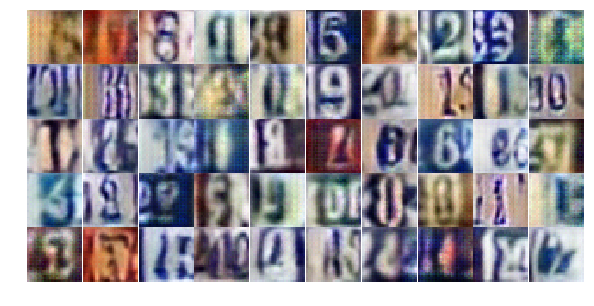

Epoch 8/25... Discriminator Loss: 1.3938... Generator Loss: 0.6208
Epoch 8/25... Discriminator Loss: 1.0892... Generator Loss: 0.7807
Epoch 8/25... Discriminator Loss: 1.4427... Generator Loss: 0.7240
Epoch 8/25... Discriminator Loss: 1.2779... Generator Loss: 0.8407
Epoch 8/25... Discriminator Loss: 0.8440... Generator Loss: 1.0004
Epoch 8/25... Discriminator Loss: 1.1862... Generator Loss: 0.7413
Epoch 8/25... Discriminator Loss: 0.8540... Generator Loss: 1.0752
Epoch 8/25... Discriminator Loss: 1.3605... Generator Loss: 1.5630
Epoch 9/25... Discriminator Loss: 1.6606... Generator Loss: 0.3888
Epoch 9/25... Discriminator Loss: 1.0579... Generator Loss: 0.8789


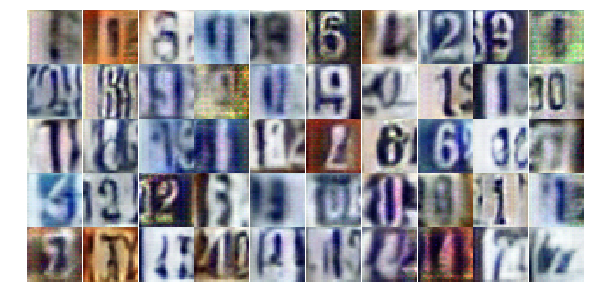

Epoch 9/25... Discriminator Loss: 1.0781... Generator Loss: 0.7908
Epoch 9/25... Discriminator Loss: 1.0747... Generator Loss: 0.6665
Epoch 9/25... Discriminator Loss: 1.6503... Generator Loss: 0.3092
Epoch 9/25... Discriminator Loss: 1.4884... Generator Loss: 0.3781
Epoch 9/25... Discriminator Loss: 1.2634... Generator Loss: 0.5457
Epoch 9/25... Discriminator Loss: 0.7146... Generator Loss: 1.1515
Epoch 9/25... Discriminator Loss: 1.0754... Generator Loss: 0.9756
Epoch 9/25... Discriminator Loss: 1.1831... Generator Loss: 0.6565
Epoch 9/25... Discriminator Loss: 0.9214... Generator Loss: 0.9539
Epoch 9/25... Discriminator Loss: 1.0477... Generator Loss: 1.4211


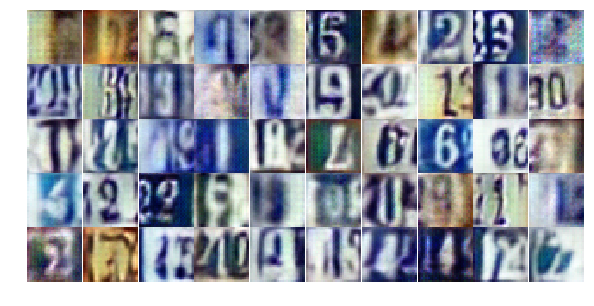

Epoch 9/25... Discriminator Loss: 0.8012... Generator Loss: 1.3240
Epoch 9/25... Discriminator Loss: 0.8766... Generator Loss: 0.9099
Epoch 9/25... Discriminator Loss: 1.3968... Generator Loss: 0.5422
Epoch 9/25... Discriminator Loss: 1.4431... Generator Loss: 0.3867
Epoch 9/25... Discriminator Loss: 0.9284... Generator Loss: 1.2289
Epoch 9/25... Discriminator Loss: 1.0453... Generator Loss: 0.8574
Epoch 9/25... Discriminator Loss: 1.0807... Generator Loss: 0.6885
Epoch 9/25... Discriminator Loss: 1.2291... Generator Loss: 0.4892
Epoch 9/25... Discriminator Loss: 1.2114... Generator Loss: 0.5300
Epoch 9/25... Discriminator Loss: 1.5078... Generator Loss: 0.3456


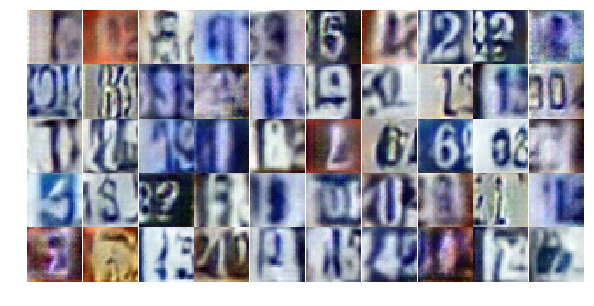

Epoch 9/25... Discriminator Loss: 1.3087... Generator Loss: 0.4885
Epoch 9/25... Discriminator Loss: 1.2344... Generator Loss: 0.5109
Epoch 9/25... Discriminator Loss: 1.0178... Generator Loss: 0.7946
Epoch 9/25... Discriminator Loss: 0.9545... Generator Loss: 0.7589
Epoch 9/25... Discriminator Loss: 1.1392... Generator Loss: 1.0997
Epoch 9/25... Discriminator Loss: 0.9122... Generator Loss: 1.0879
Epoch 9/25... Discriminator Loss: 1.0237... Generator Loss: 0.8127
Epoch 9/25... Discriminator Loss: 1.1115... Generator Loss: 1.1364
Epoch 9/25... Discriminator Loss: 1.0660... Generator Loss: 1.4161
Epoch 9/25... Discriminator Loss: 1.0284... Generator Loss: 0.5873


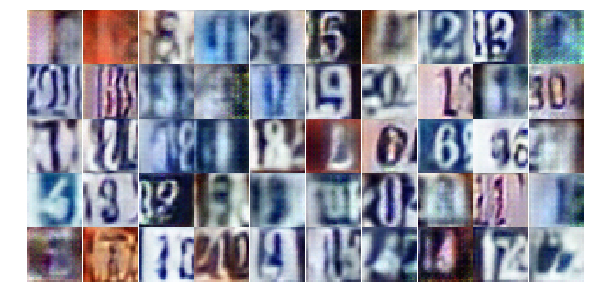

Epoch 9/25... Discriminator Loss: 1.1728... Generator Loss: 0.5465
Epoch 9/25... Discriminator Loss: 1.3617... Generator Loss: 0.4321
Epoch 9/25... Discriminator Loss: 1.0085... Generator Loss: 0.6391
Epoch 9/25... Discriminator Loss: 1.5848... Generator Loss: 0.3193
Epoch 9/25... Discriminator Loss: 1.1966... Generator Loss: 0.7379
Epoch 9/25... Discriminator Loss: 0.9340... Generator Loss: 1.1643
Epoch 9/25... Discriminator Loss: 1.0435... Generator Loss: 1.1627
Epoch 9/25... Discriminator Loss: 0.6258... Generator Loss: 1.5766
Epoch 9/25... Discriminator Loss: 1.2392... Generator Loss: 0.5924
Epoch 9/25... Discriminator Loss: 1.6214... Generator Loss: 0.2943


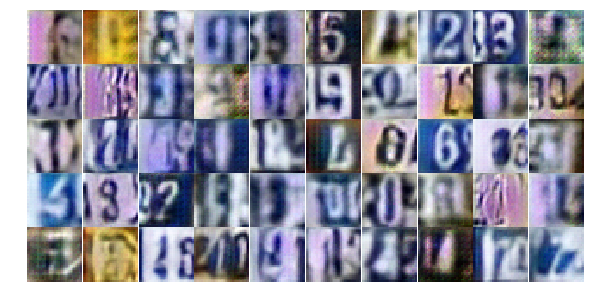

Epoch 9/25... Discriminator Loss: 1.0017... Generator Loss: 1.2156
Epoch 9/25... Discriminator Loss: 0.8287... Generator Loss: 1.0531
Epoch 9/25... Discriminator Loss: 0.9429... Generator Loss: 0.8004
Epoch 9/25... Discriminator Loss: 1.1164... Generator Loss: 0.5852
Epoch 9/25... Discriminator Loss: 1.1360... Generator Loss: 1.1713
Epoch 9/25... Discriminator Loss: 1.0988... Generator Loss: 0.7576
Epoch 9/25... Discriminator Loss: 1.0921... Generator Loss: 0.5881
Epoch 9/25... Discriminator Loss: 1.6415... Generator Loss: 0.2921
Epoch 9/25... Discriminator Loss: 1.3984... Generator Loss: 0.4054
Epoch 9/25... Discriminator Loss: 1.2065... Generator Loss: 0.6301


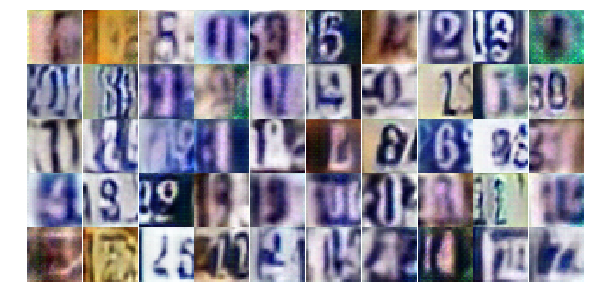

Epoch 9/25... Discriminator Loss: 1.9799... Generator Loss: 1.9068
Epoch 9/25... Discriminator Loss: 1.4562... Generator Loss: 1.2057
Epoch 9/25... Discriminator Loss: 0.7202... Generator Loss: 1.0610
Epoch 9/25... Discriminator Loss: 1.6771... Generator Loss: 0.2738
Epoch 9/25... Discriminator Loss: 0.7583... Generator Loss: 1.7942
Epoch 10/25... Discriminator Loss: 1.0061... Generator Loss: 0.7031
Epoch 10/25... Discriminator Loss: 1.3433... Generator Loss: 0.4360
Epoch 10/25... Discriminator Loss: 0.4780... Generator Loss: 1.3824
Epoch 10/25... Discriminator Loss: 1.2867... Generator Loss: 0.6314
Epoch 10/25... Discriminator Loss: 1.6312... Generator Loss: 0.3253


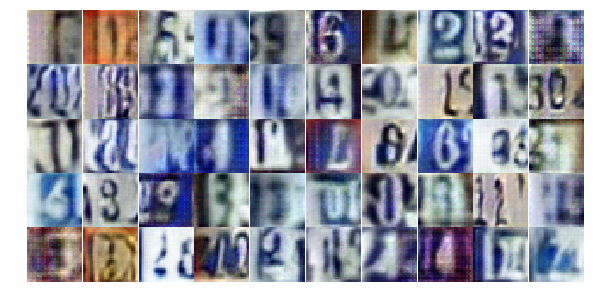

Epoch 10/25... Discriminator Loss: 1.4257... Generator Loss: 0.3808
Epoch 10/25... Discriminator Loss: 1.0311... Generator Loss: 1.2276
Epoch 10/25... Discriminator Loss: 0.8204... Generator Loss: 1.0685
Epoch 10/25... Discriminator Loss: 1.1087... Generator Loss: 0.6556
Epoch 10/25... Discriminator Loss: 0.7085... Generator Loss: 1.9809
Epoch 10/25... Discriminator Loss: 0.8714... Generator Loss: 0.9207
Epoch 10/25... Discriminator Loss: 0.9731... Generator Loss: 0.7833
Epoch 10/25... Discriminator Loss: 1.2455... Generator Loss: 0.6177
Epoch 10/25... Discriminator Loss: 1.2603... Generator Loss: 0.7512
Epoch 10/25... Discriminator Loss: 1.0966... Generator Loss: 0.9653


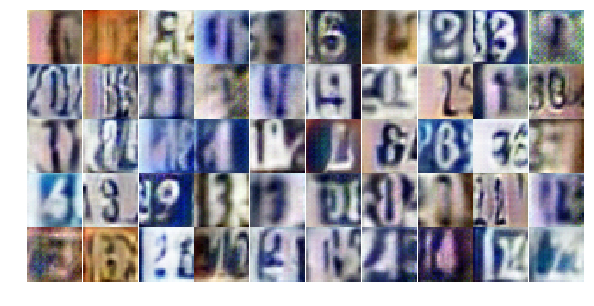

Epoch 10/25... Discriminator Loss: 1.2092... Generator Loss: 0.5334
Epoch 10/25... Discriminator Loss: 1.1839... Generator Loss: 0.8044
Epoch 10/25... Discriminator Loss: 0.8677... Generator Loss: 0.9837
Epoch 10/25... Discriminator Loss: 1.1073... Generator Loss: 0.7034
Epoch 10/25... Discriminator Loss: 0.7336... Generator Loss: 1.4046
Epoch 10/25... Discriminator Loss: 0.7874... Generator Loss: 1.0083
Epoch 10/25... Discriminator Loss: 0.7191... Generator Loss: 1.4428
Epoch 10/25... Discriminator Loss: 0.9653... Generator Loss: 1.0126
Epoch 10/25... Discriminator Loss: 1.2057... Generator Loss: 1.2626
Epoch 10/25... Discriminator Loss: 0.5500... Generator Loss: 1.9993


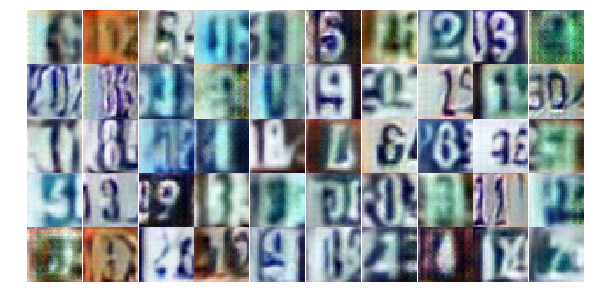

Epoch 10/25... Discriminator Loss: 1.3547... Generator Loss: 0.4312
Epoch 10/25... Discriminator Loss: 1.4533... Generator Loss: 0.4235
Epoch 10/25... Discriminator Loss: 0.8478... Generator Loss: 1.4650
Epoch 10/25... Discriminator Loss: 0.8093... Generator Loss: 1.6225
Epoch 10/25... Discriminator Loss: 0.9860... Generator Loss: 0.6957
Epoch 10/25... Discriminator Loss: 1.4395... Generator Loss: 2.5561
Epoch 10/25... Discriminator Loss: 0.8687... Generator Loss: 0.7450
Epoch 10/25... Discriminator Loss: 1.2680... Generator Loss: 0.7403
Epoch 10/25... Discriminator Loss: 1.3202... Generator Loss: 0.4416
Epoch 10/25... Discriminator Loss: 1.1847... Generator Loss: 0.6202


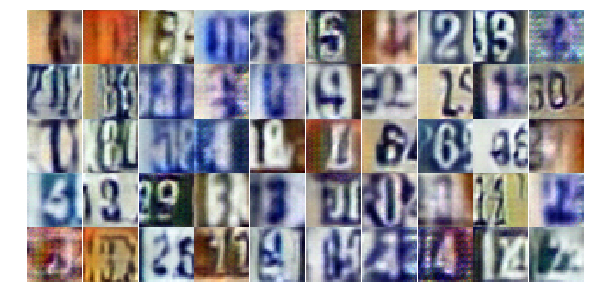

Epoch 10/25... Discriminator Loss: 1.1736... Generator Loss: 0.9338
Epoch 10/25... Discriminator Loss: 1.7728... Generator Loss: 0.2516
Epoch 10/25... Discriminator Loss: 1.1522... Generator Loss: 0.6504
Epoch 10/25... Discriminator Loss: 0.9904... Generator Loss: 0.9806
Epoch 10/25... Discriminator Loss: 0.8843... Generator Loss: 0.8851
Epoch 10/25... Discriminator Loss: 1.1148... Generator Loss: 0.6159
Epoch 10/25... Discriminator Loss: 1.1378... Generator Loss: 0.6103
Epoch 10/25... Discriminator Loss: 1.5438... Generator Loss: 0.3314
Epoch 10/25... Discriminator Loss: 1.3656... Generator Loss: 0.7302
Epoch 10/25... Discriminator Loss: 0.6999... Generator Loss: 1.3551


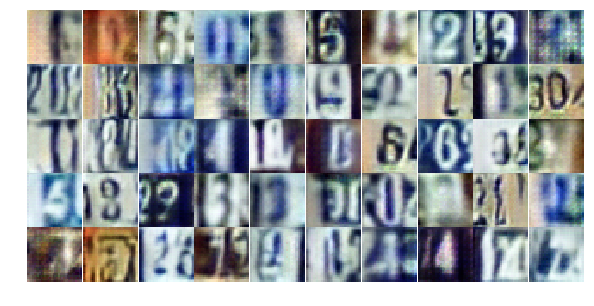

Epoch 10/25... Discriminator Loss: 1.3467... Generator Loss: 0.4196
Epoch 10/25... Discriminator Loss: 1.3986... Generator Loss: 0.6020
Epoch 10/25... Discriminator Loss: 1.2265... Generator Loss: 0.5095
Epoch 10/25... Discriminator Loss: 0.7396... Generator Loss: 1.0591
Epoch 10/25... Discriminator Loss: 0.8448... Generator Loss: 1.2012
Epoch 10/25... Discriminator Loss: 1.0138... Generator Loss: 0.8757
Epoch 10/25... Discriminator Loss: 1.0042... Generator Loss: 1.0514
Epoch 10/25... Discriminator Loss: 1.0088... Generator Loss: 0.7540
Epoch 10/25... Discriminator Loss: 0.7777... Generator Loss: 1.8280
Epoch 10/25... Discriminator Loss: 0.9788... Generator Loss: 0.7206


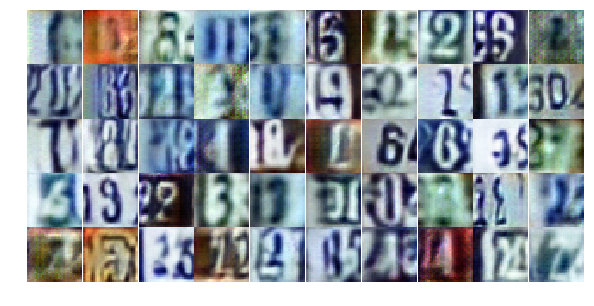

Epoch 10/25... Discriminator Loss: 1.0020... Generator Loss: 0.9365
Epoch 10/25... Discriminator Loss: 0.5060... Generator Loss: 1.4237
Epoch 10/25... Discriminator Loss: 1.6699... Generator Loss: 0.9047
Epoch 11/25... Discriminator Loss: 0.4716... Generator Loss: 2.1449
Epoch 11/25... Discriminator Loss: 0.6758... Generator Loss: 1.9567
Epoch 11/25... Discriminator Loss: 1.1647... Generator Loss: 0.5616
Epoch 11/25... Discriminator Loss: 1.5435... Generator Loss: 0.3821
Epoch 11/25... Discriminator Loss: 1.1346... Generator Loss: 0.8161
Epoch 11/25... Discriminator Loss: 1.2246... Generator Loss: 0.6203
Epoch 11/25... Discriminator Loss: 0.7659... Generator Loss: 1.0934


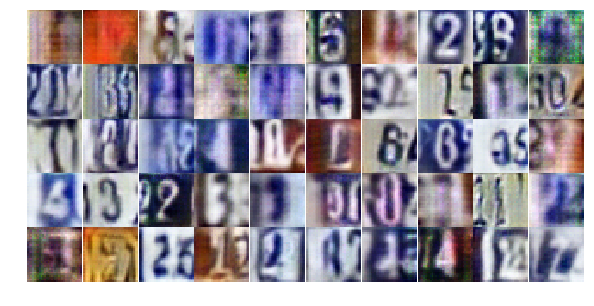

Epoch 11/25... Discriminator Loss: 0.7033... Generator Loss: 1.3247
Epoch 11/25... Discriminator Loss: 0.9308... Generator Loss: 0.8855
Epoch 11/25... Discriminator Loss: 0.7235... Generator Loss: 1.0018
Epoch 11/25... Discriminator Loss: 0.8429... Generator Loss: 1.1518
Epoch 11/25... Discriminator Loss: 0.5902... Generator Loss: 1.3172
Epoch 11/25... Discriminator Loss: 0.7293... Generator Loss: 1.2782
Epoch 11/25... Discriminator Loss: 0.8734... Generator Loss: 0.8066
Epoch 11/25... Discriminator Loss: 0.8101... Generator Loss: 1.3165
Epoch 11/25... Discriminator Loss: 0.7923... Generator Loss: 0.9028
Epoch 11/25... Discriminator Loss: 1.3240... Generator Loss: 0.4676


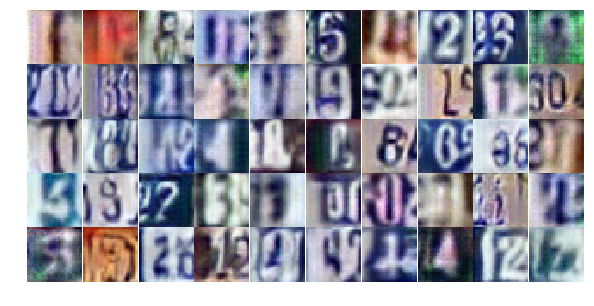

Epoch 11/25... Discriminator Loss: 0.9219... Generator Loss: 0.7603
Epoch 11/25... Discriminator Loss: 0.9047... Generator Loss: 1.1352
Epoch 11/25... Discriminator Loss: 1.4604... Generator Loss: 0.3676
Epoch 11/25... Discriminator Loss: 0.8344... Generator Loss: 0.7522
Epoch 11/25... Discriminator Loss: 0.2947... Generator Loss: 2.7426
Epoch 11/25... Discriminator Loss: 1.1706... Generator Loss: 0.5436
Epoch 11/25... Discriminator Loss: 1.0215... Generator Loss: 0.8326
Epoch 11/25... Discriminator Loss: 1.7374... Generator Loss: 0.2612
Epoch 11/25... Discriminator Loss: 0.5901... Generator Loss: 1.4304
Epoch 11/25... Discriminator Loss: 1.4934... Generator Loss: 0.3437


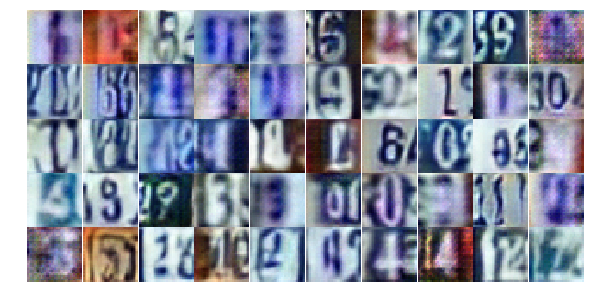

Epoch 11/25... Discriminator Loss: 0.9639... Generator Loss: 0.8408
Epoch 11/25... Discriminator Loss: 1.0540... Generator Loss: 0.6657
Epoch 11/25... Discriminator Loss: 1.4601... Generator Loss: 0.5697
Epoch 11/25... Discriminator Loss: 0.8030... Generator Loss: 0.8728
Epoch 11/25... Discriminator Loss: 0.8426... Generator Loss: 1.0763
Epoch 11/25... Discriminator Loss: 1.4558... Generator Loss: 1.3332
Epoch 11/25... Discriminator Loss: 1.4799... Generator Loss: 0.4078
Epoch 11/25... Discriminator Loss: 1.5637... Generator Loss: 2.2098
Epoch 11/25... Discriminator Loss: 0.8935... Generator Loss: 0.9386
Epoch 11/25... Discriminator Loss: 1.4274... Generator Loss: 0.3520


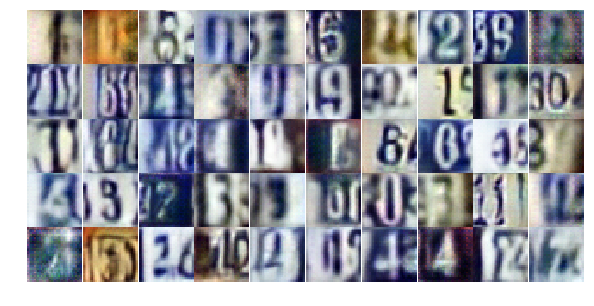

Epoch 11/25... Discriminator Loss: 1.0560... Generator Loss: 1.3224
Epoch 11/25... Discriminator Loss: 1.0559... Generator Loss: 0.6075
Epoch 11/25... Discriminator Loss: 0.8600... Generator Loss: 0.8935
Epoch 11/25... Discriminator Loss: 2.5187... Generator Loss: 1.5911
Epoch 11/25... Discriminator Loss: 1.1507... Generator Loss: 0.5867
Epoch 11/25... Discriminator Loss: 0.7713... Generator Loss: 1.0339
Epoch 11/25... Discriminator Loss: 0.8153... Generator Loss: 1.1848
Epoch 11/25... Discriminator Loss: 0.5709... Generator Loss: 1.3985
Epoch 11/25... Discriminator Loss: 1.7177... Generator Loss: 0.2926
Epoch 11/25... Discriminator Loss: 0.6042... Generator Loss: 1.3347


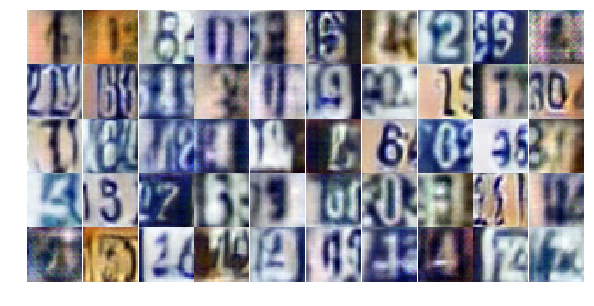

Epoch 11/25... Discriminator Loss: 1.3217... Generator Loss: 1.7023
Epoch 11/25... Discriminator Loss: 0.3517... Generator Loss: 1.8916
Epoch 11/25... Discriminator Loss: 0.6315... Generator Loss: 1.0382
Epoch 11/25... Discriminator Loss: 1.1956... Generator Loss: 0.7704
Epoch 11/25... Discriminator Loss: 2.2232... Generator Loss: 0.1475
Epoch 11/25... Discriminator Loss: 0.9313... Generator Loss: 0.8840
Epoch 11/25... Discriminator Loss: 0.9358... Generator Loss: 0.7856
Epoch 11/25... Discriminator Loss: 0.6078... Generator Loss: 1.3267
Epoch 11/25... Discriminator Loss: 2.1742... Generator Loss: 0.1954
Epoch 11/25... Discriminator Loss: 1.5142... Generator Loss: 0.3526


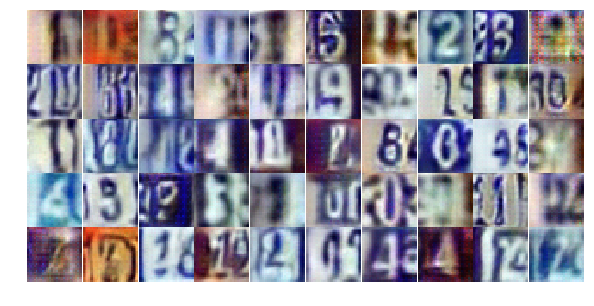

Epoch 12/25... Discriminator Loss: 1.3122... Generator Loss: 0.9256
Epoch 12/25... Discriminator Loss: 1.2622... Generator Loss: 1.1748
Epoch 12/25... Discriminator Loss: 1.1285... Generator Loss: 0.5558
Epoch 12/25... Discriminator Loss: 0.7355... Generator Loss: 1.2621
Epoch 12/25... Discriminator Loss: 0.7321... Generator Loss: 1.4607
Epoch 12/25... Discriminator Loss: 1.1939... Generator Loss: 0.6373
Epoch 12/25... Discriminator Loss: 1.0664... Generator Loss: 0.7884
Epoch 12/25... Discriminator Loss: 0.7879... Generator Loss: 1.0332
Epoch 12/25... Discriminator Loss: 0.7595... Generator Loss: 1.1360
Epoch 12/25... Discriminator Loss: 1.0429... Generator Loss: 0.7369


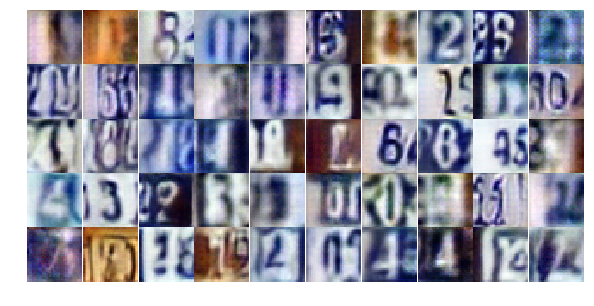

Epoch 12/25... Discriminator Loss: 0.5176... Generator Loss: 1.3400
Epoch 12/25... Discriminator Loss: 0.5170... Generator Loss: 2.3094
Epoch 12/25... Discriminator Loss: 0.6557... Generator Loss: 1.0422
Epoch 12/25... Discriminator Loss: 0.7142... Generator Loss: 0.9840
Epoch 12/25... Discriminator Loss: 1.3505... Generator Loss: 2.8344
Epoch 12/25... Discriminator Loss: 1.3530... Generator Loss: 0.4879
Epoch 12/25... Discriminator Loss: 1.0765... Generator Loss: 0.6305
Epoch 12/25... Discriminator Loss: 1.1711... Generator Loss: 0.5489
Epoch 12/25... Discriminator Loss: 0.7822... Generator Loss: 1.5011
Epoch 12/25... Discriminator Loss: 1.0310... Generator Loss: 0.6501


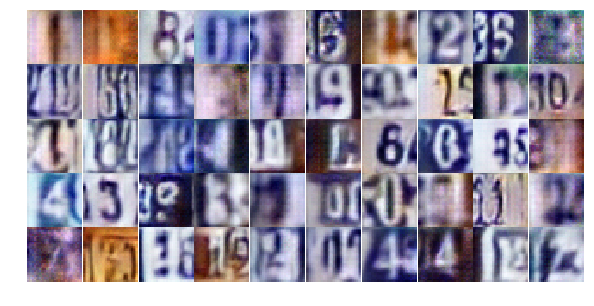

Epoch 12/25... Discriminator Loss: 1.7387... Generator Loss: 2.6074
Epoch 12/25... Discriminator Loss: 1.2343... Generator Loss: 0.9472
Epoch 12/25... Discriminator Loss: 0.6570... Generator Loss: 1.2326
Epoch 12/25... Discriminator Loss: 1.0789... Generator Loss: 1.0290
Epoch 12/25... Discriminator Loss: 0.7055... Generator Loss: 1.0291
Epoch 12/25... Discriminator Loss: 0.6831... Generator Loss: 0.9794
Epoch 12/25... Discriminator Loss: 1.0069... Generator Loss: 0.8570
Epoch 12/25... Discriminator Loss: 0.6146... Generator Loss: 1.1186
Epoch 12/25... Discriminator Loss: 0.9095... Generator Loss: 0.7582
Epoch 12/25... Discriminator Loss: 1.1696... Generator Loss: 0.6511


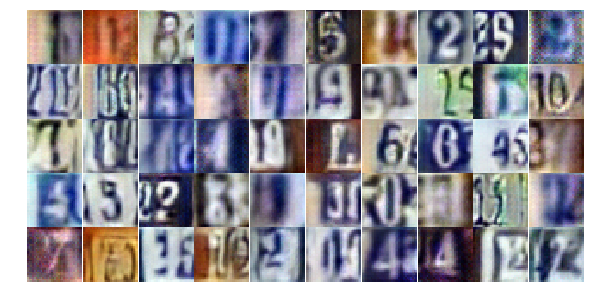

Epoch 12/25... Discriminator Loss: 0.9847... Generator Loss: 0.7677
Epoch 12/25... Discriminator Loss: 1.3160... Generator Loss: 0.4611
Epoch 12/25... Discriminator Loss: 1.0184... Generator Loss: 0.6530
Epoch 12/25... Discriminator Loss: 1.5465... Generator Loss: 0.3739
Epoch 12/25... Discriminator Loss: 0.5081... Generator Loss: 2.7071
Epoch 12/25... Discriminator Loss: 1.7128... Generator Loss: 1.8553
Epoch 12/25... Discriminator Loss: 0.6081... Generator Loss: 1.2705
Epoch 12/25... Discriminator Loss: 0.6398... Generator Loss: 1.5431
Epoch 12/25... Discriminator Loss: 0.7371... Generator Loss: 1.3984
Epoch 12/25... Discriminator Loss: 0.2231... Generator Loss: 3.3564


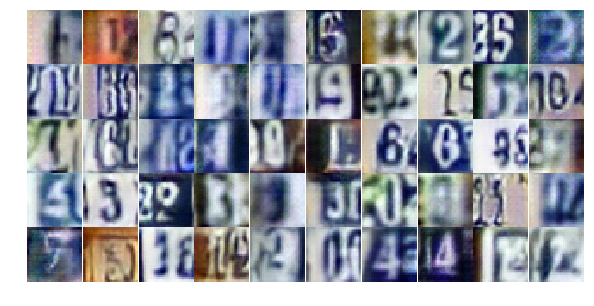

Epoch 12/25... Discriminator Loss: 0.8080... Generator Loss: 0.8955
Epoch 12/25... Discriminator Loss: 0.7661... Generator Loss: 0.9711
Epoch 12/25... Discriminator Loss: 0.6386... Generator Loss: 1.0650
Epoch 12/25... Discriminator Loss: 1.7042... Generator Loss: 1.3447
Epoch 12/25... Discriminator Loss: 0.6376... Generator Loss: 1.1807
Epoch 12/25... Discriminator Loss: 1.3689... Generator Loss: 0.8467
Epoch 12/25... Discriminator Loss: 0.6146... Generator Loss: 1.2060
Epoch 12/25... Discriminator Loss: 0.9621... Generator Loss: 0.8608
Epoch 12/25... Discriminator Loss: 0.7939... Generator Loss: 0.9273
Epoch 12/25... Discriminator Loss: 0.9508... Generator Loss: 1.6709


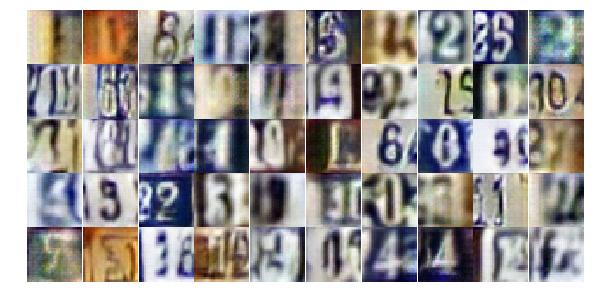

Epoch 12/25... Discriminator Loss: 1.3994... Generator Loss: 0.6962
Epoch 12/25... Discriminator Loss: 0.4115... Generator Loss: 1.4337
Epoch 12/25... Discriminator Loss: 1.1086... Generator Loss: 0.6538
Epoch 12/25... Discriminator Loss: 0.6700... Generator Loss: 1.9195
Epoch 12/25... Discriminator Loss: 0.2209... Generator Loss: 2.4965
Epoch 12/25... Discriminator Loss: 1.1903... Generator Loss: 1.1165
Epoch 12/25... Discriminator Loss: 1.0277... Generator Loss: 0.7606
Epoch 13/25... Discriminator Loss: 0.9791... Generator Loss: 1.8617
Epoch 13/25... Discriminator Loss: 0.9792... Generator Loss: 2.0618
Epoch 13/25... Discriminator Loss: 1.0908... Generator Loss: 0.9565


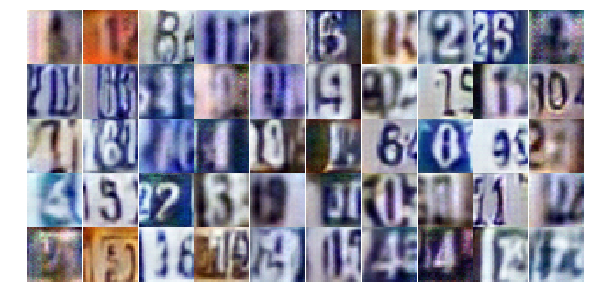

Epoch 13/25... Discriminator Loss: 0.7929... Generator Loss: 1.6216
Epoch 13/25... Discriminator Loss: 1.2579... Generator Loss: 1.4072
Epoch 13/25... Discriminator Loss: 0.9743... Generator Loss: 1.0121
Epoch 13/25... Discriminator Loss: 1.2861... Generator Loss: 0.4873
Epoch 13/25... Discriminator Loss: 0.9432... Generator Loss: 0.8368
Epoch 13/25... Discriminator Loss: 0.4509... Generator Loss: 1.7695
Epoch 13/25... Discriminator Loss: 0.6781... Generator Loss: 0.9935
Epoch 13/25... Discriminator Loss: 1.3774... Generator Loss: 0.4331
Epoch 13/25... Discriminator Loss: 1.3182... Generator Loss: 0.4373
Epoch 13/25... Discriminator Loss: 0.5378... Generator Loss: 1.4446


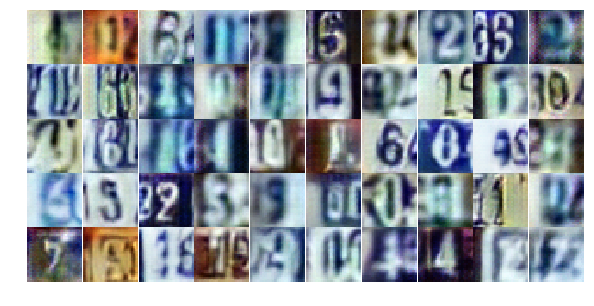

Epoch 13/25... Discriminator Loss: 1.6366... Generator Loss: 0.4875
Epoch 13/25... Discriminator Loss: 1.0586... Generator Loss: 0.6547
Epoch 13/25... Discriminator Loss: 0.5421... Generator Loss: 1.4478
Epoch 13/25... Discriminator Loss: 0.8977... Generator Loss: 0.9980
Epoch 13/25... Discriminator Loss: 0.7045... Generator Loss: 1.4095
Epoch 13/25... Discriminator Loss: 1.0672... Generator Loss: 1.7070
Epoch 13/25... Discriminator Loss: 1.6028... Generator Loss: 0.3534
Epoch 13/25... Discriminator Loss: 1.3649... Generator Loss: 0.4209
Epoch 13/25... Discriminator Loss: 0.9517... Generator Loss: 1.1046
Epoch 13/25... Discriminator Loss: 1.0015... Generator Loss: 1.0439


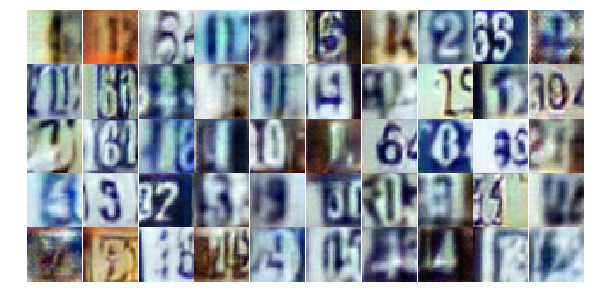

Epoch 13/25... Discriminator Loss: 0.6144... Generator Loss: 1.4584
Epoch 13/25... Discriminator Loss: 0.3784... Generator Loss: 1.7524
Epoch 13/25... Discriminator Loss: 0.4312... Generator Loss: 2.0295
Epoch 13/25... Discriminator Loss: 0.8890... Generator Loss: 0.7547
Epoch 13/25... Discriminator Loss: 0.6093... Generator Loss: 1.4791
Epoch 13/25... Discriminator Loss: 0.6341... Generator Loss: 2.6385
Epoch 13/25... Discriminator Loss: 0.9673... Generator Loss: 2.2995
Epoch 13/25... Discriminator Loss: 0.6400... Generator Loss: 2.2811
Epoch 13/25... Discriminator Loss: 1.6366... Generator Loss: 0.3589
Epoch 13/25... Discriminator Loss: 1.0837... Generator Loss: 2.2001


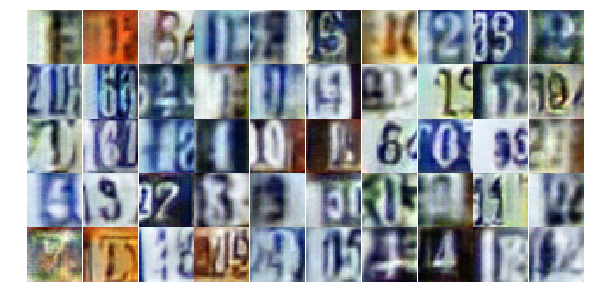

Epoch 13/25... Discriminator Loss: 0.7150... Generator Loss: 1.5843
Epoch 13/25... Discriminator Loss: 0.6507... Generator Loss: 3.8382
Epoch 13/25... Discriminator Loss: 1.7524... Generator Loss: 0.2928
Epoch 13/25... Discriminator Loss: 1.5421... Generator Loss: 1.2411
Epoch 13/25... Discriminator Loss: 0.8188... Generator Loss: 1.2290
Epoch 13/25... Discriminator Loss: 0.7565... Generator Loss: 1.1092
Epoch 13/25... Discriminator Loss: 0.7882... Generator Loss: 1.0979
Epoch 13/25... Discriminator Loss: 0.8144... Generator Loss: 1.2558
Epoch 13/25... Discriminator Loss: 0.3227... Generator Loss: 1.9065
Epoch 13/25... Discriminator Loss: 1.6510... Generator Loss: 0.3100


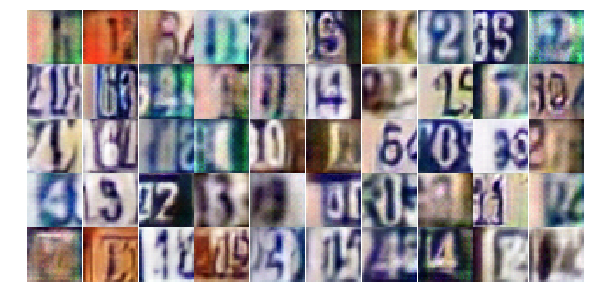

Epoch 13/25... Discriminator Loss: 0.6358... Generator Loss: 1.5443
Epoch 13/25... Discriminator Loss: 0.5482... Generator Loss: 1.4454
Epoch 13/25... Discriminator Loss: 0.5083... Generator Loss: 1.5234
Epoch 13/25... Discriminator Loss: 0.8384... Generator Loss: 1.1294
Epoch 13/25... Discriminator Loss: 1.0973... Generator Loss: 0.6104
Epoch 13/25... Discriminator Loss: 0.8735... Generator Loss: 0.8018
Epoch 13/25... Discriminator Loss: 0.4957... Generator Loss: 1.4827
Epoch 13/25... Discriminator Loss: 1.0526... Generator Loss: 0.5987
Epoch 13/25... Discriminator Loss: 0.1628... Generator Loss: 2.7043
Epoch 13/25... Discriminator Loss: 1.4081... Generator Loss: 0.4173


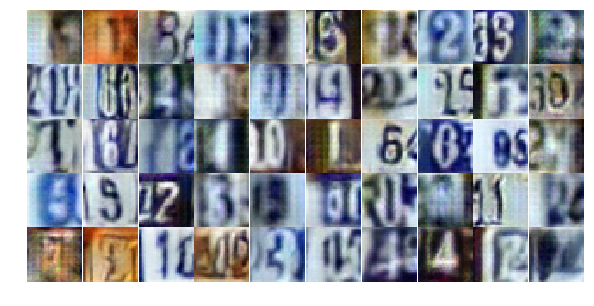

Epoch 13/25... Discriminator Loss: 1.0601... Generator Loss: 0.7517
Epoch 13/25... Discriminator Loss: 2.0145... Generator Loss: 0.2728
Epoch 13/25... Discriminator Loss: 1.6114... Generator Loss: 0.6256
Epoch 13/25... Discriminator Loss: 0.5276... Generator Loss: 1.7352
Epoch 14/25... Discriminator Loss: 0.9823... Generator Loss: 2.5634
Epoch 14/25... Discriminator Loss: 0.9870... Generator Loss: 1.0179
Epoch 14/25... Discriminator Loss: 1.0204... Generator Loss: 0.8333
Epoch 14/25... Discriminator Loss: 1.0848... Generator Loss: 0.7121
Epoch 14/25... Discriminator Loss: 1.1650... Generator Loss: 0.5678
Epoch 14/25... Discriminator Loss: 0.7429... Generator Loss: 0.9486


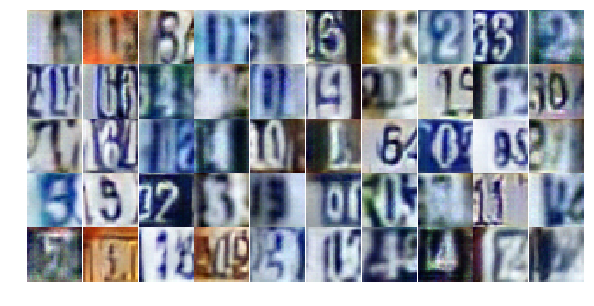

Epoch 14/25... Discriminator Loss: 1.8516... Generator Loss: 0.2375
Epoch 14/25... Discriminator Loss: 0.4439... Generator Loss: 1.6735
Epoch 14/25... Discriminator Loss: 1.0422... Generator Loss: 0.7159
Epoch 14/25... Discriminator Loss: 0.8018... Generator Loss: 0.8281
Epoch 14/25... Discriminator Loss: 0.6568... Generator Loss: 1.0886
Epoch 14/25... Discriminator Loss: 0.3504... Generator Loss: 1.8505
Epoch 14/25... Discriminator Loss: 0.9649... Generator Loss: 1.3568
Epoch 14/25... Discriminator Loss: 0.6513... Generator Loss: 1.2140
Epoch 14/25... Discriminator Loss: 1.0149... Generator Loss: 0.6278
Epoch 14/25... Discriminator Loss: 1.9017... Generator Loss: 0.2480


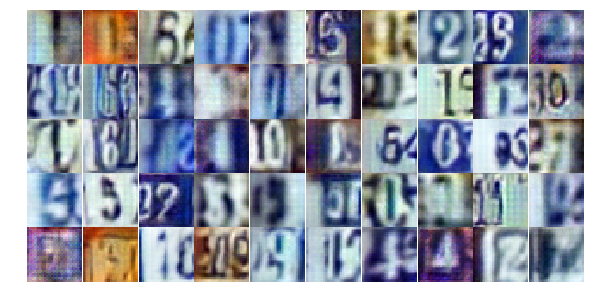

Epoch 14/25... Discriminator Loss: 1.4246... Generator Loss: 0.3860
Epoch 14/25... Discriminator Loss: 0.6901... Generator Loss: 1.0702
Epoch 14/25... Discriminator Loss: 1.6301... Generator Loss: 0.5129
Epoch 14/25... Discriminator Loss: 0.8816... Generator Loss: 0.9163
Epoch 14/25... Discriminator Loss: 0.8596... Generator Loss: 0.8381
Epoch 14/25... Discriminator Loss: 0.7089... Generator Loss: 1.3963
Epoch 14/25... Discriminator Loss: 0.7975... Generator Loss: 1.0673
Epoch 14/25... Discriminator Loss: 0.8190... Generator Loss: 0.8973
Epoch 14/25... Discriminator Loss: 0.7337... Generator Loss: 1.0166
Epoch 14/25... Discriminator Loss: 1.2911... Generator Loss: 0.7418


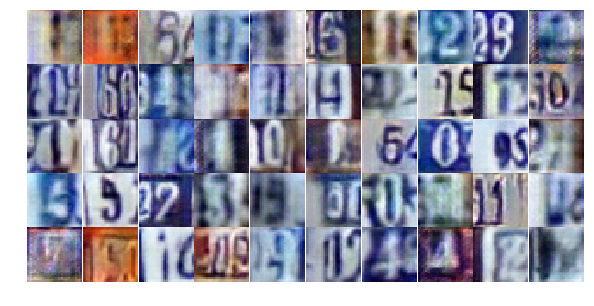

Epoch 14/25... Discriminator Loss: 1.3548... Generator Loss: 0.4543
Epoch 14/25... Discriminator Loss: 0.6194... Generator Loss: 1.4700
Epoch 14/25... Discriminator Loss: 0.7681... Generator Loss: 1.0900
Epoch 14/25... Discriminator Loss: 0.4534... Generator Loss: 1.5657
Epoch 14/25... Discriminator Loss: 0.0762... Generator Loss: 4.8952
Epoch 14/25... Discriminator Loss: 0.5109... Generator Loss: 1.9390
Epoch 14/25... Discriminator Loss: 2.5142... Generator Loss: 3.3078
Epoch 14/25... Discriminator Loss: 1.0029... Generator Loss: 1.7218
Epoch 14/25... Discriminator Loss: 0.8736... Generator Loss: 1.3206
Epoch 14/25... Discriminator Loss: 1.1219... Generator Loss: 0.9225


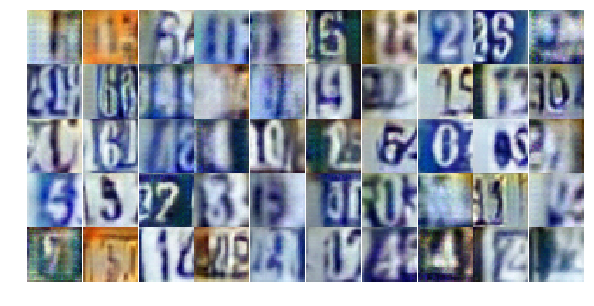

Epoch 14/25... Discriminator Loss: 1.2357... Generator Loss: 0.6993
Epoch 14/25... Discriminator Loss: 0.9267... Generator Loss: 0.9752
Epoch 14/25... Discriminator Loss: 0.7090... Generator Loss: 0.9791
Epoch 14/25... Discriminator Loss: 1.0884... Generator Loss: 0.5357
Epoch 14/25... Discriminator Loss: 0.9863... Generator Loss: 0.9660
Epoch 14/25... Discriminator Loss: 1.1459... Generator Loss: 0.5676
Epoch 14/25... Discriminator Loss: 0.7874... Generator Loss: 1.5030
Epoch 14/25... Discriminator Loss: 0.8277... Generator Loss: 0.8432
Epoch 14/25... Discriminator Loss: 0.3175... Generator Loss: 1.9633
Epoch 14/25... Discriminator Loss: 1.9849... Generator Loss: 0.2345


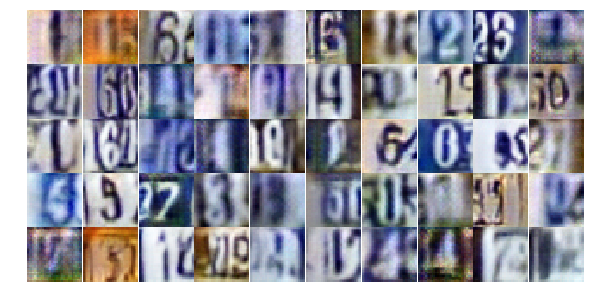

Epoch 14/25... Discriminator Loss: 1.4180... Generator Loss: 0.4704
Epoch 14/25... Discriminator Loss: 1.4546... Generator Loss: 0.3748
Epoch 14/25... Discriminator Loss: 0.6684... Generator Loss: 2.0385
Epoch 14/25... Discriminator Loss: 1.4316... Generator Loss: 0.4275
Epoch 14/25... Discriminator Loss: 0.9878... Generator Loss: 0.6782
Epoch 14/25... Discriminator Loss: 1.6792... Generator Loss: 0.3058
Epoch 14/25... Discriminator Loss: 1.1209... Generator Loss: 0.5954
Epoch 14/25... Discriminator Loss: 0.4818... Generator Loss: 1.3158
Epoch 14/25... Discriminator Loss: 1.7755... Generator Loss: 0.3162
Epoch 14/25... Discriminator Loss: 1.4075... Generator Loss: 0.4765


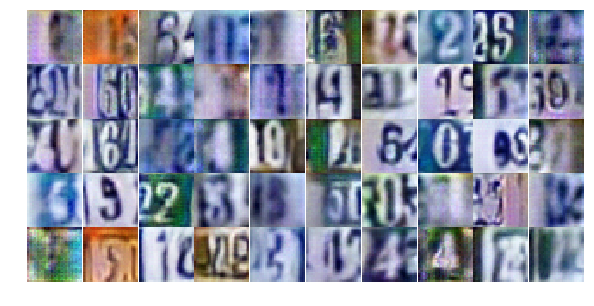

Epoch 14/25... Discriminator Loss: 0.8659... Generator Loss: 0.8989
Epoch 14/25... Discriminator Loss: 1.1545... Generator Loss: 1.8890
Epoch 15/25... Discriminator Loss: 0.2401... Generator Loss: 2.9245
Epoch 15/25... Discriminator Loss: 0.7529... Generator Loss: 1.3232
Epoch 15/25... Discriminator Loss: 0.6164... Generator Loss: 1.2805
Epoch 15/25... Discriminator Loss: 1.7261... Generator Loss: 0.3385
Epoch 15/25... Discriminator Loss: 1.5105... Generator Loss: 0.5240
Epoch 15/25... Discriminator Loss: 0.7080... Generator Loss: 1.0003
Epoch 15/25... Discriminator Loss: 1.7257... Generator Loss: 0.6549
Epoch 15/25... Discriminator Loss: 1.4854... Generator Loss: 0.4197


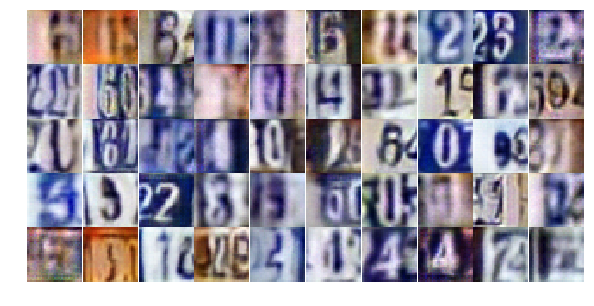

Epoch 15/25... Discriminator Loss: 0.6296... Generator Loss: 1.7475
Epoch 15/25... Discriminator Loss: 0.7535... Generator Loss: 0.8889
Epoch 15/25... Discriminator Loss: 1.5507... Generator Loss: 0.3904
Epoch 15/25... Discriminator Loss: 1.2379... Generator Loss: 0.6223
Epoch 15/25... Discriminator Loss: 1.2656... Generator Loss: 0.5181
Epoch 15/25... Discriminator Loss: 0.6920... Generator Loss: 0.9825
Epoch 15/25... Discriminator Loss: 0.3741... Generator Loss: 4.3064
Epoch 15/25... Discriminator Loss: 0.8221... Generator Loss: 0.9888
Epoch 15/25... Discriminator Loss: 0.6954... Generator Loss: 2.6205
Epoch 15/25... Discriminator Loss: 0.9431... Generator Loss: 0.7071


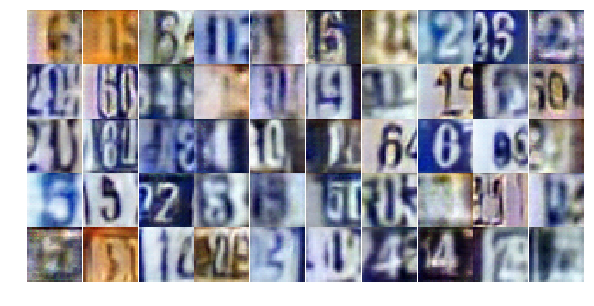

Epoch 15/25... Discriminator Loss: 1.8316... Generator Loss: 0.2656
Epoch 15/25... Discriminator Loss: 0.9035... Generator Loss: 1.1820
Epoch 15/25... Discriminator Loss: 0.2102... Generator Loss: 2.9141
Epoch 15/25... Discriminator Loss: 1.0185... Generator Loss: 0.6413
Epoch 15/25... Discriminator Loss: 1.4942... Generator Loss: 2.0684
Epoch 15/25... Discriminator Loss: 0.5085... Generator Loss: 1.3392
Epoch 15/25... Discriminator Loss: 1.5686... Generator Loss: 0.3874
Epoch 15/25... Discriminator Loss: 1.4138... Generator Loss: 0.4634
Epoch 15/25... Discriminator Loss: 0.8871... Generator Loss: 1.2323
Epoch 15/25... Discriminator Loss: 1.3306... Generator Loss: 0.5133


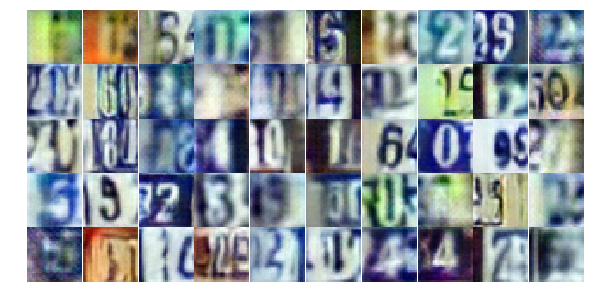

Epoch 15/25... Discriminator Loss: 1.0236... Generator Loss: 0.7272
Epoch 15/25... Discriminator Loss: 1.0372... Generator Loss: 0.7336
Epoch 15/25... Discriminator Loss: 0.7628... Generator Loss: 0.9496
Epoch 15/25... Discriminator Loss: 0.8898... Generator Loss: 0.7590
Epoch 15/25... Discriminator Loss: 1.3078... Generator Loss: 0.5335
Epoch 15/25... Discriminator Loss: 0.9325... Generator Loss: 1.0539
Epoch 15/25... Discriminator Loss: 0.9976... Generator Loss: 0.6503
Epoch 15/25... Discriminator Loss: 0.5141... Generator Loss: 1.2135
Epoch 15/25... Discriminator Loss: 0.5583... Generator Loss: 1.4492
Epoch 15/25... Discriminator Loss: 0.8312... Generator Loss: 0.8066


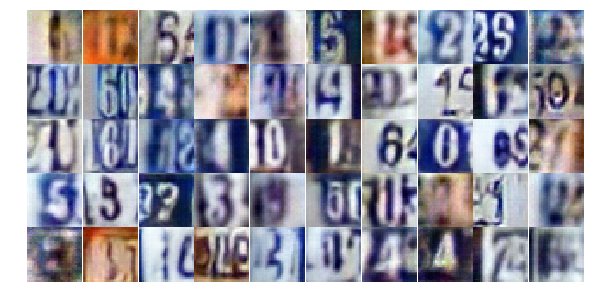

Epoch 15/25... Discriminator Loss: 0.6636... Generator Loss: 1.0894
Epoch 15/25... Discriminator Loss: 2.1130... Generator Loss: 0.1777
Epoch 15/25... Discriminator Loss: 0.8617... Generator Loss: 1.0855
Epoch 15/25... Discriminator Loss: 0.5066... Generator Loss: 2.0650
Epoch 15/25... Discriminator Loss: 0.4464... Generator Loss: 1.3583
Epoch 15/25... Discriminator Loss: 1.8256... Generator Loss: 0.2858
Epoch 15/25... Discriminator Loss: 0.7154... Generator Loss: 1.3272
Epoch 15/25... Discriminator Loss: 0.7548... Generator Loss: 1.3225
Epoch 15/25... Discriminator Loss: 0.9946... Generator Loss: 0.7273
Epoch 15/25... Discriminator Loss: 0.9974... Generator Loss: 0.8275


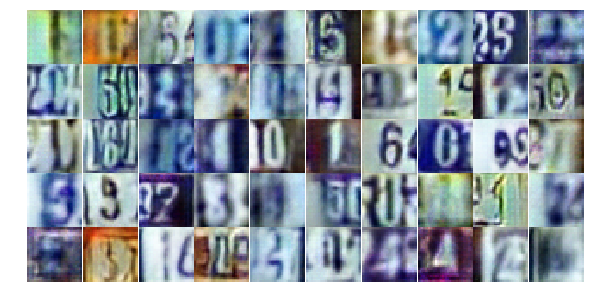

Epoch 15/25... Discriminator Loss: 1.8846... Generator Loss: 0.3121
Epoch 15/25... Discriminator Loss: 1.1558... Generator Loss: 0.5726
Epoch 15/25... Discriminator Loss: 0.7602... Generator Loss: 0.9085
Epoch 15/25... Discriminator Loss: 0.8450... Generator Loss: 1.2510
Epoch 15/25... Discriminator Loss: 0.5784... Generator Loss: 1.6274
Epoch 15/25... Discriminator Loss: 0.8519... Generator Loss: 1.7842
Epoch 15/25... Discriminator Loss: 1.7428... Generator Loss: 0.3076
Epoch 15/25... Discriminator Loss: 1.3800... Generator Loss: 0.5646
Epoch 15/25... Discriminator Loss: 1.3190... Generator Loss: 0.5309
Epoch 16/25... Discriminator Loss: 0.8333... Generator Loss: 0.9648


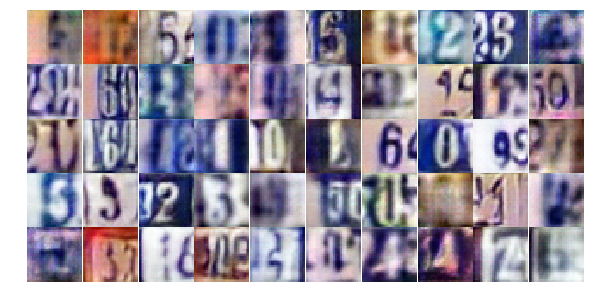

Epoch 16/25... Discriminator Loss: 0.7464... Generator Loss: 0.9836
Epoch 16/25... Discriminator Loss: 0.7281... Generator Loss: 0.9342
Epoch 16/25... Discriminator Loss: 0.5944... Generator Loss: 1.2758
Epoch 16/25... Discriminator Loss: 0.6051... Generator Loss: 1.1972
Epoch 16/25... Discriminator Loss: 0.8699... Generator Loss: 1.7927
Epoch 16/25... Discriminator Loss: 0.8737... Generator Loss: 1.1175
Epoch 16/25... Discriminator Loss: 1.8173... Generator Loss: 0.2948
Epoch 16/25... Discriminator Loss: 1.4513... Generator Loss: 0.3703
Epoch 16/25... Discriminator Loss: 1.6158... Generator Loss: 0.8905
Epoch 16/25... Discriminator Loss: 0.9761... Generator Loss: 0.7471


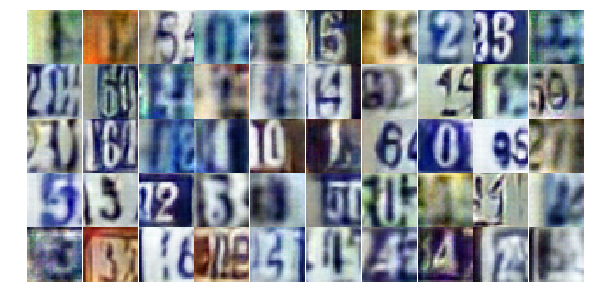

Epoch 16/25... Discriminator Loss: 0.9116... Generator Loss: 2.5459
Epoch 16/25... Discriminator Loss: 0.6836... Generator Loss: 1.0944
Epoch 16/25... Discriminator Loss: 0.6991... Generator Loss: 1.2388
Epoch 16/25... Discriminator Loss: 0.7593... Generator Loss: 0.9168
Epoch 16/25... Discriminator Loss: 0.3015... Generator Loss: 1.9164
Epoch 16/25... Discriminator Loss: 0.6931... Generator Loss: 0.9122
Epoch 16/25... Discriminator Loss: 0.8623... Generator Loss: 0.8006
Epoch 16/25... Discriminator Loss: 1.1521... Generator Loss: 0.6009
Epoch 16/25... Discriminator Loss: 0.6875... Generator Loss: 1.0001
Epoch 16/25... Discriminator Loss: 1.7045... Generator Loss: 0.3465


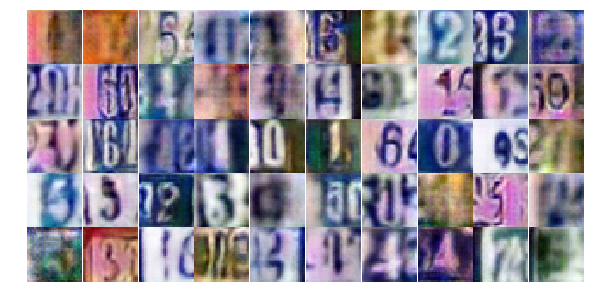

Epoch 16/25... Discriminator Loss: 1.0451... Generator Loss: 0.8461
Epoch 16/25... Discriminator Loss: 1.3046... Generator Loss: 0.5306
Epoch 16/25... Discriminator Loss: 0.8042... Generator Loss: 0.9039
Epoch 16/25... Discriminator Loss: 1.3856... Generator Loss: 0.4527
Epoch 16/25... Discriminator Loss: 0.4101... Generator Loss: 1.6409
Epoch 16/25... Discriminator Loss: 0.8183... Generator Loss: 0.8910
Epoch 16/25... Discriminator Loss: 1.3393... Generator Loss: 1.9312
Epoch 16/25... Discriminator Loss: 0.4268... Generator Loss: 1.4502
Epoch 16/25... Discriminator Loss: 0.8573... Generator Loss: 0.8869
Epoch 16/25... Discriminator Loss: 1.1458... Generator Loss: 0.5482


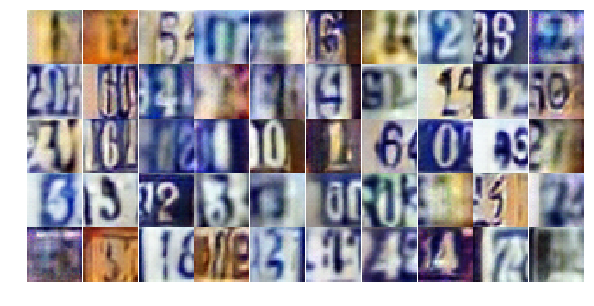

Epoch 16/25... Discriminator Loss: 1.3452... Generator Loss: 0.4874
Epoch 16/25... Discriminator Loss: 0.7636... Generator Loss: 0.9286
Epoch 16/25... Discriminator Loss: 1.0849... Generator Loss: 0.5918
Epoch 16/25... Discriminator Loss: 1.1062... Generator Loss: 0.6031
Epoch 16/25... Discriminator Loss: 3.9126... Generator Loss: 1.5583
Epoch 16/25... Discriminator Loss: 2.0354... Generator Loss: 0.2379
Epoch 16/25... Discriminator Loss: 1.0991... Generator Loss: 0.7189
Epoch 16/25... Discriminator Loss: 1.4552... Generator Loss: 0.4020
Epoch 16/25... Discriminator Loss: 1.2610... Generator Loss: 0.5632
Epoch 16/25... Discriminator Loss: 0.7253... Generator Loss: 1.1932


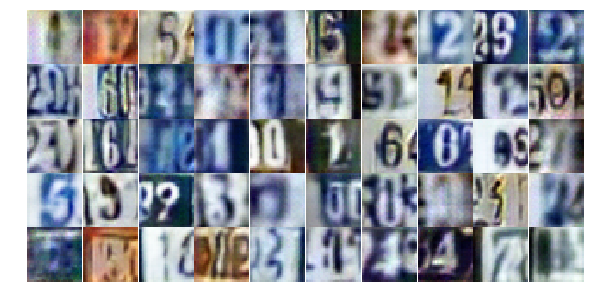

Epoch 16/25... Discriminator Loss: 0.9173... Generator Loss: 1.0767
Epoch 16/25... Discriminator Loss: 0.8561... Generator Loss: 1.1199
Epoch 16/25... Discriminator Loss: 0.8024... Generator Loss: 0.9144
Epoch 16/25... Discriminator Loss: 0.9423... Generator Loss: 1.5176
Epoch 16/25... Discriminator Loss: 1.2552... Generator Loss: 0.5709
Epoch 16/25... Discriminator Loss: 1.1129... Generator Loss: 0.6667
Epoch 16/25... Discriminator Loss: 0.9372... Generator Loss: 0.9340
Epoch 16/25... Discriminator Loss: 1.1499... Generator Loss: 0.6242
Epoch 16/25... Discriminator Loss: 1.0055... Generator Loss: 0.6966
Epoch 16/25... Discriminator Loss: 0.3706... Generator Loss: 2.5409


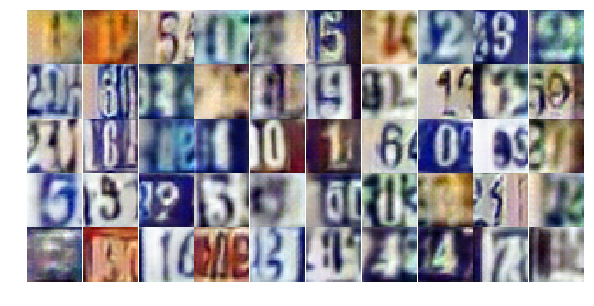

Epoch 16/25... Discriminator Loss: 2.1172... Generator Loss: 0.2093
Epoch 16/25... Discriminator Loss: 0.6410... Generator Loss: 0.9791


KeyboardInterrupt: 

In [38]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [ ]:
_ = view_samples(-1, samples, 5, 10, figsize=(10,5))